# Dataset 2: Predicting Earthquake Damage Grade in Nepal
<img src="https://s3.amazonaws.com/drivendata-public-assets/nepal-quake-bm-2.JPG" width="400" height="300">

## Group Name : Nekoman (Tutorial: MA01)
### 1. Kevin Nathanael Gunawan (U2220002K)
### 2. Reynaldy Widjaja (U2220381E)

## Table of Contents:

### 1. Exploratory
#### A. Numerical Variable
1. Uni-Variate Analysis (Box-Plot, Histogram, and Violin-Plot)
2. Bi-Variate Analysis (Scatter Plot)
3. Multi-Variate Analysis (Pair-Plot and Heatmap)

#### B. Categorical Variable
1. Uni-Variate Analysis (Cat-Plot)
2. Bi-Variate Analysis (Heatmap)

#### C. Numerical and Categorical Variable
1. Bi-Variate Analysis (Heatmap and Box-Plot)
2. Multi-Variate Analysis (Bar-Plot)

#### D. Feature Selection (On the Categorical Variable)
1. Chi Square
2. Mutual Information

### 2. Machine Learning
#### A. Compare Multiple Algorithm
1. Decision Tree (Normal Iteration + Grid Search CV)
2. Random Forest (Normal Iteration + Randomized Search CV)
3. K Nearest Neighbors (Normal Iteration)
4. Naive Bayes (Normal Iteration and Grid Search)
5. Artificial Neural Network
6. Ensemble Method (Voting)
#### **Blues = Manual Iteration / Red = Grid/Randomized Search CV

### 3. Prediction (On the Test_Labels)
### 4. Conclusion

### **All Inputs

In [8]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale=2)
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
import tensorflow as tf
from sklearn.ensemble import VotingClassifier



### **All Variable Symbol Meaning:
1. df = Full dataset & df2 = Full dataset without "building_id"
2. df_num (Numerical Variable) & df_cat (Categorical Variable)
3. df_num_norm (Numerical Variable after Normalization)
4. df_mutual (Full dataset after feature selection)
5. df_scale (Sample from the full dataset - 1% of the original)
6. X (All Predictors from full dataset) & Y (Response Variable)
7. X_train, Y_train, X_test, Y_test (Train and test dataset for comparing all machine learning algorithm)
8. x (All Predictors from sampling dataset) & y (Response Variable from sampling dataset)

# Exploratory Analysis

In [1]:
import numpy as np
import pandas as pd

In [9]:
# Import the dataset (drop building_id from train_labels)
train_values = pd.read_csv("train_values.csv")
train_labels = pd.read_csv("train_labels.csv").drop("building_id", axis=1)
df = pd.concat([train_values,train_labels], axis =1)

In [10]:
df.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,...,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,...,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,...,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,...,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,...,0,0,0,0,0,0,0,0,0,3


In [11]:
df.shape

(260601, 40)

We have 260601 rows with 40 columns (variables)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 40 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   building_id                             260601 non-null  int64 
 1   geo_level_1_id                          260601 non-null  int64 
 2   geo_level_2_id                          260601 non-null  int64 
 3   geo_level_3_id                          260601 non-null  int64 
 4   count_floors_pre_eq                     260601 non-null  int64 
 5   age                                     260601 non-null  int64 
 6   area_percentage                         260601 non-null  int64 
 7   height_percentage                       260601 non-null  int64 
 8   land_surface_condition                  260601 non-null  object
 9   foundation_type                         260601 non-null  object
 10  roof_type                               260601 non-null 

In [13]:
df.describe()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
count,2.606010e+05,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,...,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,5.256755e+05,13.900353,701.074685,6257.876148,2.129723,26.535029,8.018051,5.434365,0.088645,0.761935,...,0.033626,0.008101,0.000940,0.000361,0.001071,0.000188,0.000146,0.000088,0.005119,2.238272
std,3.045450e+05,8.033617,412.710734,3646.369645,0.727665,73.565937,4.392231,1.918418,0.284231,0.425900,...,0.180265,0.089638,0.030647,0.018989,0.032703,0.013711,0.012075,0.009394,0.071364,0.611814
min,4.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.611900e+05,7.000000,350.000000,3073.000000,2.000000,10.000000,5.000000,4.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,5.257570e+05,12.000000,702.000000,6270.000000,2.000000,15.000000,7.000000,5.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,7.897620e+05,21.000000,1050.000000,9412.000000,2.000000,30.000000,9.000000,6.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.052934e+06,30.000000,1427.000000,12567.000000,9.000000,995.000000,100.000000,32.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000


## Seperate Numerical and Categorical Variables

In [14]:
# If the data type is "object" or it's a binary, it's a categorical value

for i in df:
    if df[i].dtype == "object":
        df[i] = df[i].astype("category")
    if df[i].dtype == "int64":
        if df[i].nunique() == 2:
            df[i] = df[i].astype("category")
            
# number of families, count floor, and damage grade are also a categorical data

df['count_families'] = df['count_families'].astype('category')
df['count_floors_pre_eq'] = df['count_floors_pre_eq'].astype('category')
df['damage_grade'] = df['damage_grade'].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 40 columns):
 #   Column                                  Non-Null Count   Dtype   
---  ------                                  --------------   -----   
 0   building_id                             260601 non-null  int64   
 1   geo_level_1_id                          260601 non-null  int64   
 2   geo_level_2_id                          260601 non-null  int64   
 3   geo_level_3_id                          260601 non-null  int64   
 4   count_floors_pre_eq                     260601 non-null  category
 5   age                                     260601 non-null  int64   
 6   area_percentage                         260601 non-null  int64   
 7   height_percentage                       260601 non-null  int64   
 8   land_surface_condition                  260601 non-null  category
 9   foundation_type                         260601 non-null  category
 10  roof_type                       

In [15]:
# From this we can seperate the data frame and analyze them seperately

df_num = df.select_dtypes("int64")
df_cat = df.select_dtypes("category")

## Numerical Variable

### Univariate Analysis

In [9]:
df_num.describe()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,age,area_percentage,height_percentage
count,2.606010e+05,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,5.256755e+05,13.900353,701.074685,6257.876148,26.535029,8.018051,5.434365
std,3.045450e+05,8.033617,412.710734,3646.369645,73.565937,4.392231,1.918418
min,4.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000
25%,2.611900e+05,7.000000,350.000000,3073.000000,10.000000,5.000000,4.000000
50%,5.257570e+05,12.000000,702.000000,6270.000000,15.000000,7.000000,5.000000
75%,7.897620e+05,21.000000,1050.000000,9412.000000,30.000000,9.000000,6.000000
max,1.052934e+06,30.000000,1427.000000,12567.000000,995.000000,100.000000,32.000000


In [6]:
# Normalize before plotting
df_num_norm = df_num.copy()

In [7]:
for i in df_num_norm:
    min_val = df_num[i].min()
    max_val = df_num[i].max()
    if "id" in i: # We won't be normalizing "id" vriable
        continue
    elif max_val - min_val < 100: # Use logaritmic standarization if the range is bigger than 100
        df_num_norm[i] = (df_num[i]-df_num[i].min())/(df_num[i].max()-df_num[i].min())
    else:
        df_num_norm[i] = df_num_norm[i].replace(0, 1) # Change it to 1 so it doesn't get inf when using logaritmic standarization
        df_num_norm[i] = np.log10(df_num_norm[i])

df_num_norm.describe()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,age,area_percentage,height_percentage
count,2.606010e+05,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,5.256755e+05,13.900353,701.074685,6257.876148,1.137283,0.070889,0.114479
std,3.045450e+05,8.033617,412.710734,3646.369645,0.507185,0.044366,0.063947
min,4.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.611900e+05,7.000000,350.000000,3073.000000,1.000000,0.040404,0.066667
50%,5.257570e+05,12.000000,702.000000,6270.000000,1.176091,0.060606,0.100000
75%,7.897620e+05,21.000000,1050.000000,9412.000000,1.477121,0.080808,0.133333
max,1.052934e+06,30.000000,1427.000000,12567.000000,2.997823,1.000000,1.000000


From here, we can drop building id, since it won't be usefull in the machine learning. However, we won't drop geo_building_id, since it represents the location of the building which obviously will effect our prediction model

In [8]:
df_num = df_num.drop('building_id', axis=1)
df_num_norm = df_num_norm.drop('building_id', axis=1)

In [24]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale=2) # Make the font a little bit bigger

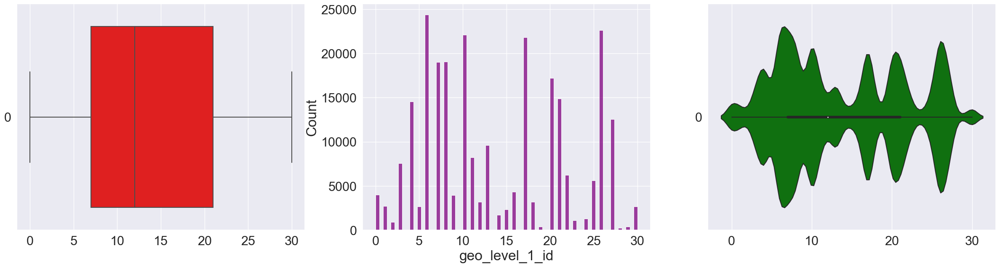

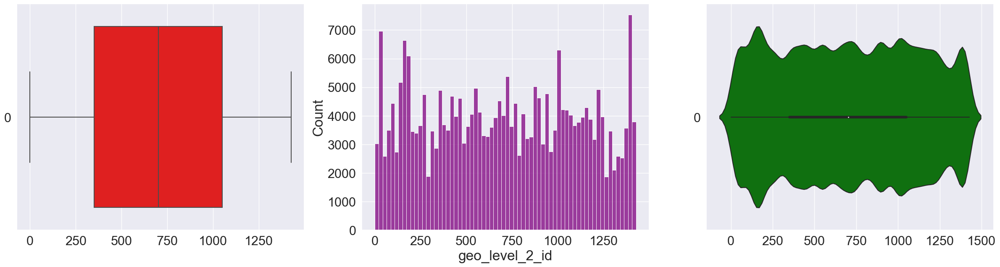

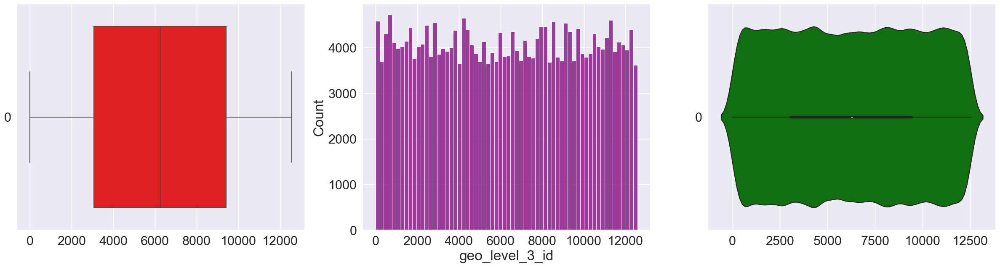

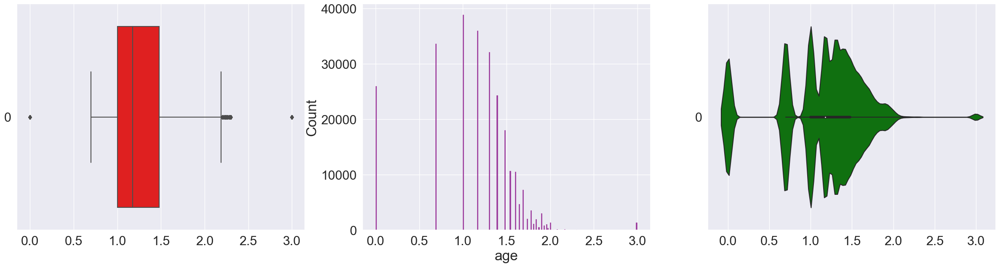

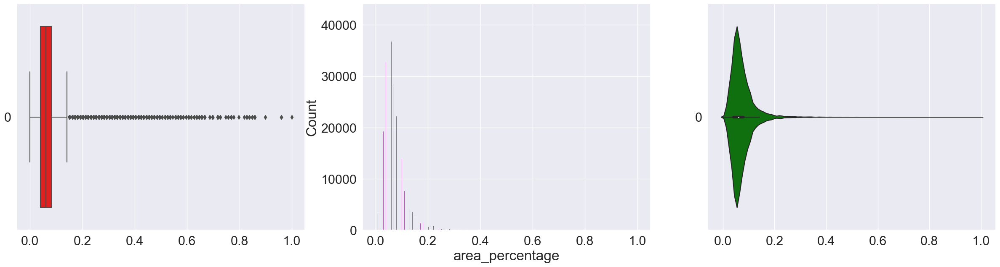

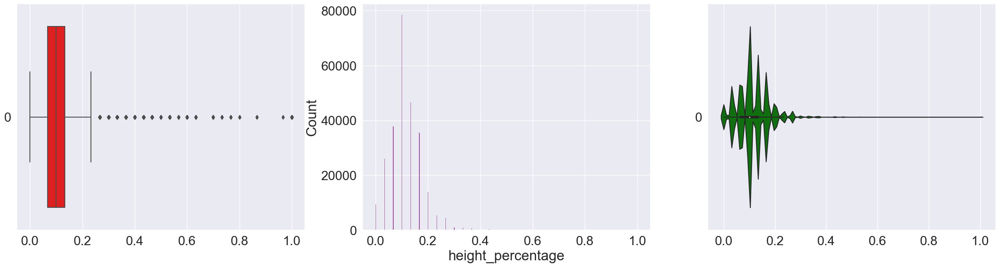

In [14]:
# Box plot, Histogram, and Violin Plot (Using Normalize Dataset)

for i in df_num_norm:
    f, axes = plt.subplots(1, 3, figsize=(30, 7))
    sns.boxplot(data = df_num_norm[i], orient = "h", ax = axes[0], color='red')
    sns.histplot(data = df_num_norm[i], ax = axes[1], color ='purple')
    sns.violinplot(data = df_num_norm[i], orient = "h", ax = axes[2], color='green')

From Observation:
1. Most building only has 2 floors
2. Most age of the building is around 10-200 years old with a few outliers around 900 years
3. Geo_level_id are distributed evenly throughout the data and have no outliers, especially geo_level_3.
4. Most Area percentage has the value of 1-20, but there are also a lot of outliers
5. The same for height percentage with 1-10 for the most values, except some outliers

### Bi-Variate Analysis

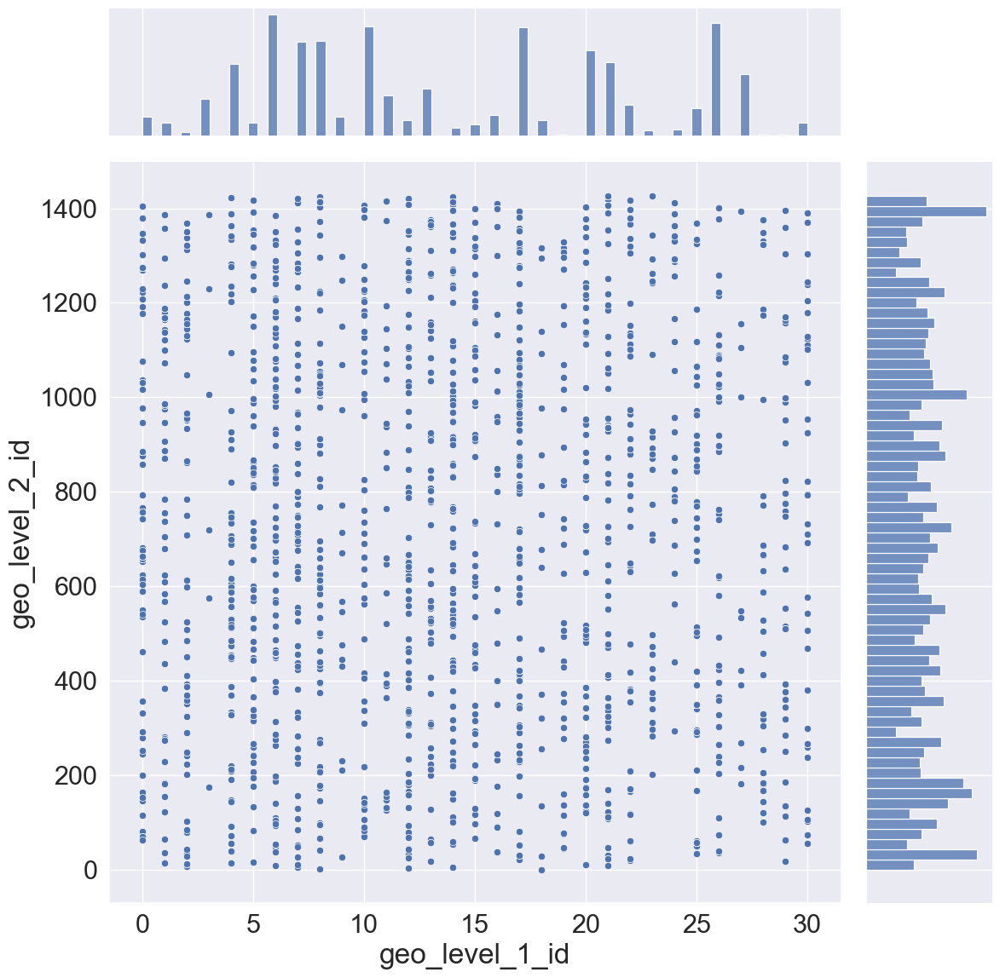

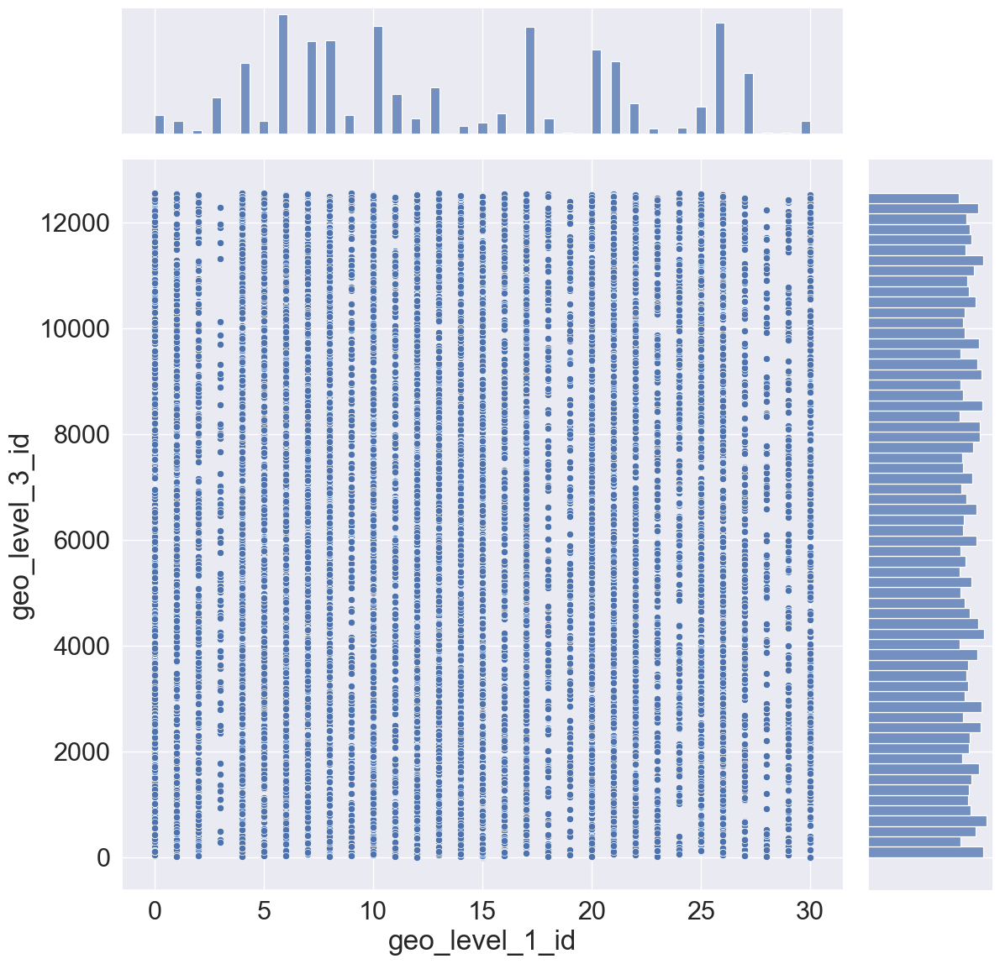

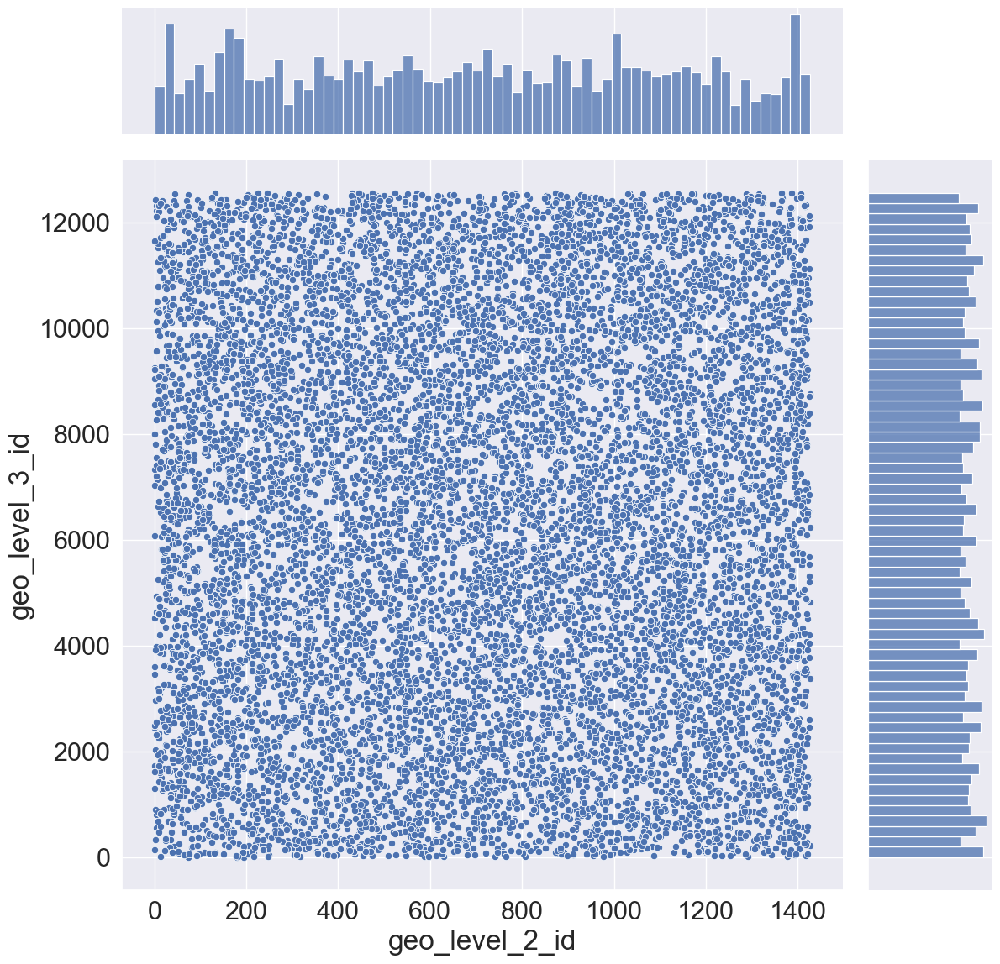

In [15]:
# Scatter Plot among geo_level_id

sns.jointplot(data = df_num, x = "geo_level_1_id", y = "geo_level_2_id", height = 12)
sns.jointplot(data = df_num, x = "geo_level_1_id", y = "geo_level_3_id", height = 12)
sns.jointplot(data = df_num, x = "geo_level_2_id", y = "geo_level_3_id", height = 12)

We can see that on each point of geo_level_2_id and geo_level_1_id, there are multiple geo_level_3_id
Therefore, we can conclude that geo_level represents a certain coordinate of the building but there are no correlation among those coordinate

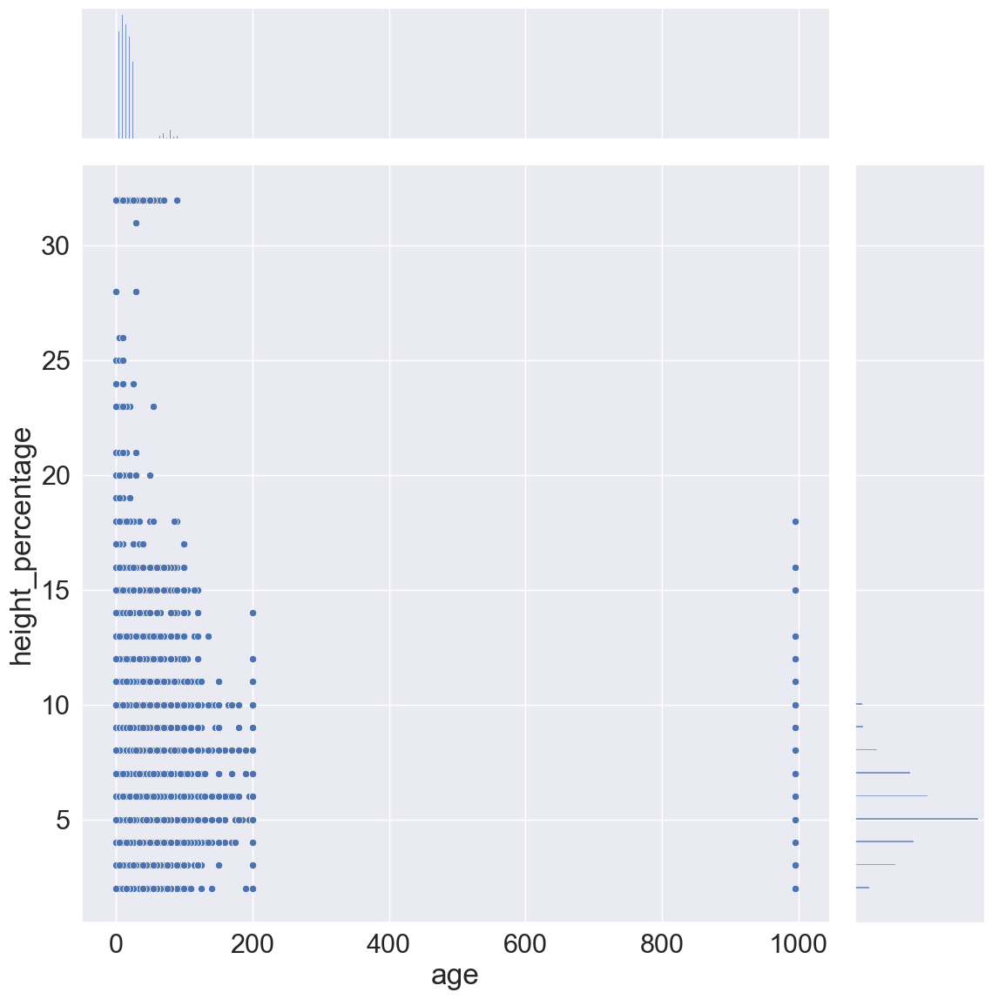

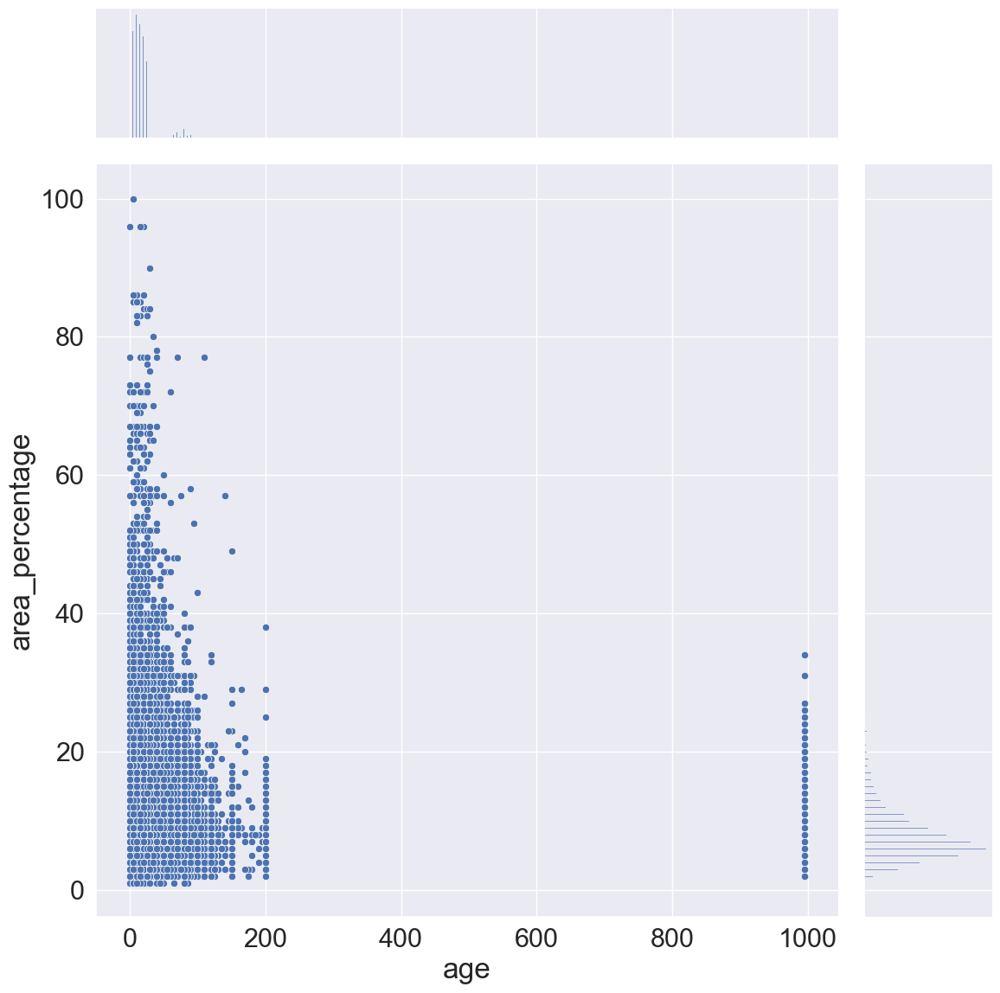

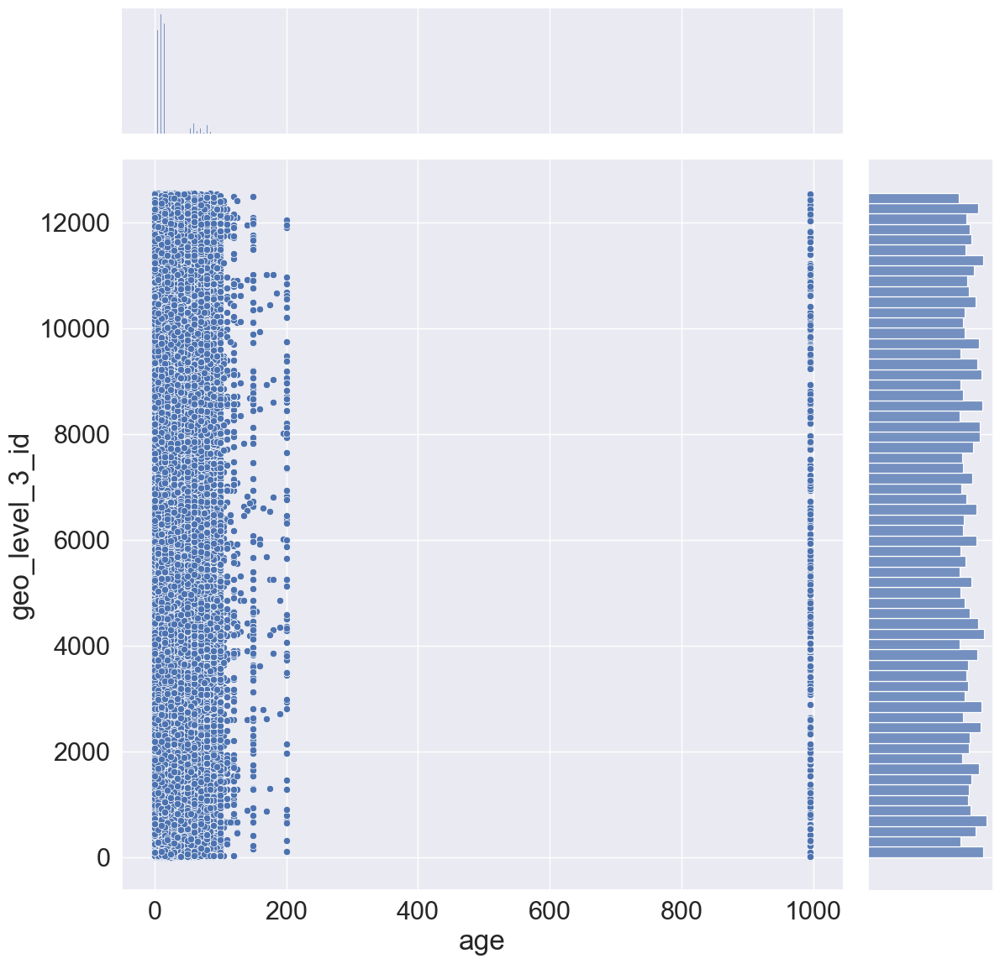

In [16]:
# Scatter Plot against building age

sns.jointplot(data = df_num, x = "age", y = "height_percentage", height = 12)
sns.jointplot(data = df_num, x = "age", y = "area_percentage", height = 12)
sns.jointplot(data = df_num, x = "age", y = "geo_level_3_id", height = 12)

From here, we can see the connection between variable age and other variable.

It looks like age also doesn't have any linear correlation with any variables, especially with geo_level_id, since in every value of age, there are various values of area and height percentage and also geo_level_id.

However, for building age, we can see that most of their values are around 0-200 and suddenly jumps to almost 1000 years.

It means that in Nepal, there are lots of ancient buildings, with one being an exception or a landmark.

### Multi-Variate Analysis

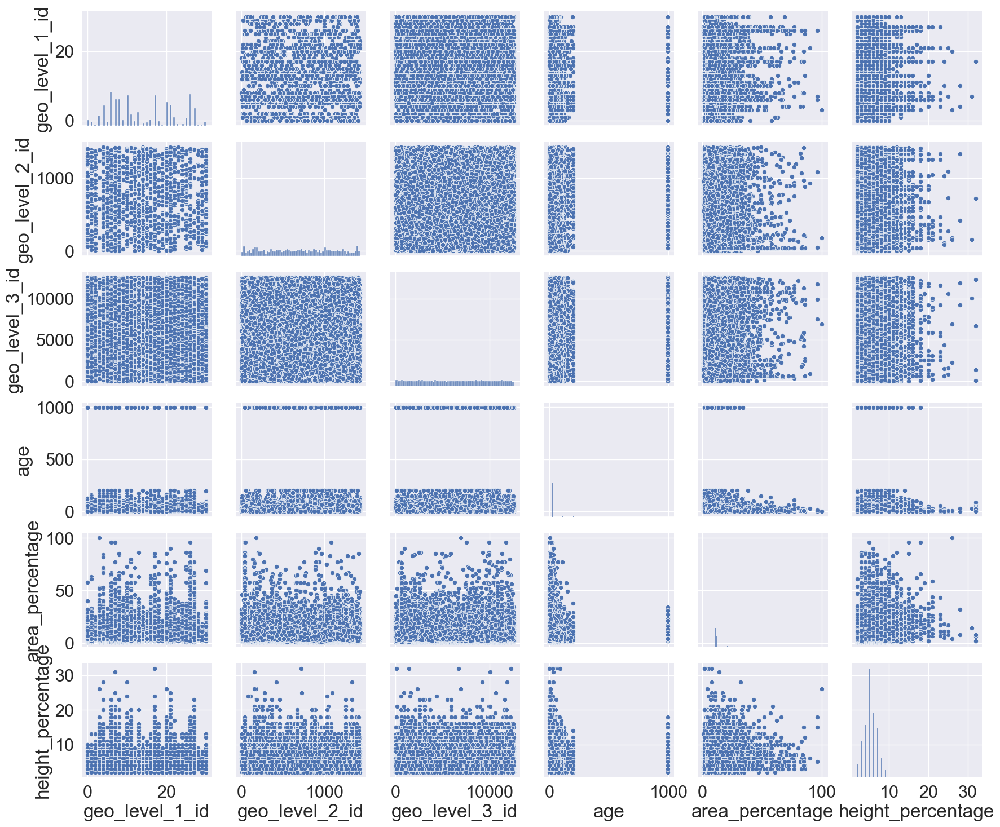

In [17]:
sns.pairplot(data=df_num, aspect = 1.2, height = 2.5)

In [18]:
df_num.corr()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,age,area_percentage,height_percentage
geo_level_1_id,1.000000,-0.061405,0.002718,-0.003908,0.071158,-0.063474
geo_level_2_id,-0.061405,1.000000,0.000921,0.012594,-0.049443,0.035516
geo_level_3_id,0.002718,0.000921,1.000000,-0.006385,-0.005643,-0.024507
age,-0.003908,0.012594,-0.006385,1.000000,-0.004323,0.061074
area_percentage,0.071158,-0.049443,-0.005643,-0.004323,1.000000,0.196645
height_percentage,-0.063474,0.035516,-0.024507,0.061074,0.196645,1.000000


Text(0.5, 1.0, 'Correlation of all Numeric Variables')

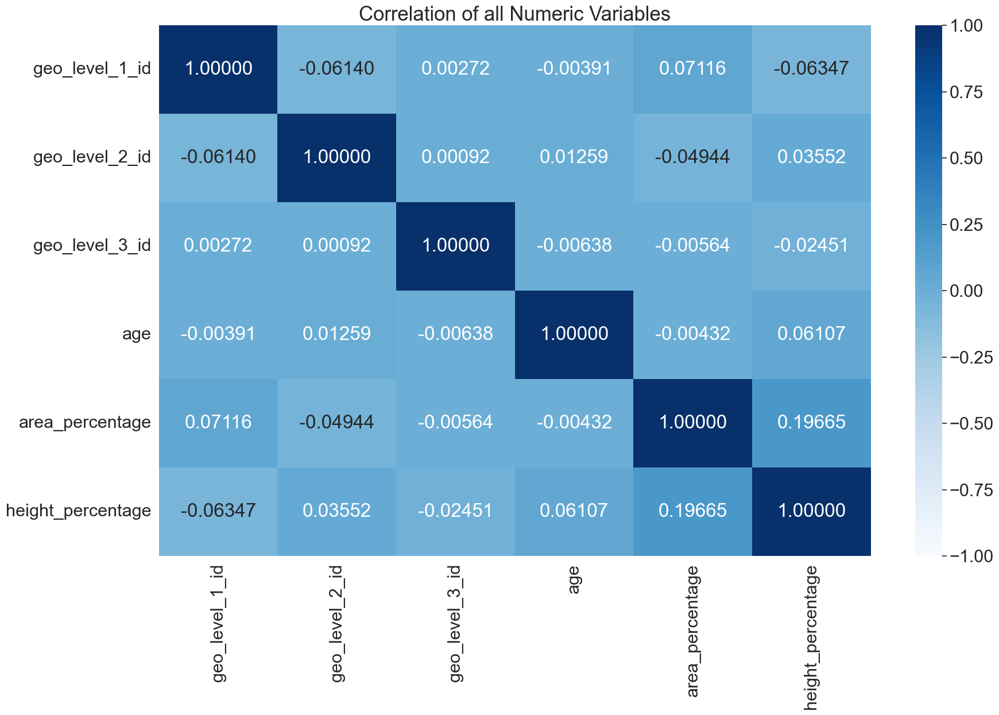

In [19]:
f, axes = plt.subplots(figsize=(20,12))
sns.heatmap(df_num.corr(), vmin = -1, vmax = 1, annot = True, fmt=".5f", cmap='Blues')
plt.title("Correlation of all Numeric Variables", size = 25)

## Categorical Variables

### Uni-Variate Analysis

In [16]:
df_cat.describe()

,count_floors_pre_eq,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
count,260601,260601,260601,260601,260601,260601,260601,260601,260601,260601,...,260601,260601,260601,260601,260601,260601,260601,260601,260601,260601
unique,9,3,5,3,5,4,4,10,2,2,...,2,2,2,2,2,2,2,2,2,3
top,2,t,r,n,f,q,s,d,0,1,...,0,0,0,0,0,0,0,0,0,2
freq,156623,216757,219196,182842,209619,165282,202090,250072,237500,198561,...,251838,258490,260356,260507,260322,260552,260563,260578,259267,148259


Number of unique value: 3
2    148259
3     87218
1     25124
Name: damage_grade, dtype: int64


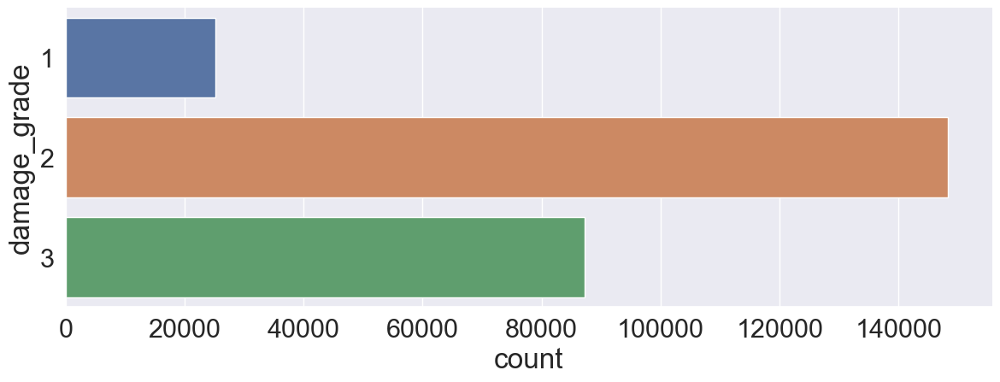

In [17]:
# Count plot of damage_grade

g = sns.catplot(y = "damage_grade", data = df_cat, kind = "count")
g.fig.set_size_inches(15, 5)

print(f"Number of unique value: {df_cat['damage_grade'].nunique()}")
print(df_cat['damage_grade'].value_counts())

From here, we can see that most houses are in level 2 with amount of 148,259 houses

C:\Users\reyna\anaconda3\lib\site-packages\seaborn\categorical.py:3750: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\reyna\anaconda3\lib\site-packages\seaborn\categorical.py:3750: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\reyna\anaconda3\lib\site-packages\seaborn\categorical.py:3750: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\reyna\anaconda3\lib\site-packages\seaborn\categorical.py:3750: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\reyna\anaconda3\lib\site-packages\seaborn\categorical.py:3750: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
C:\Users\reyna\anaconda3\

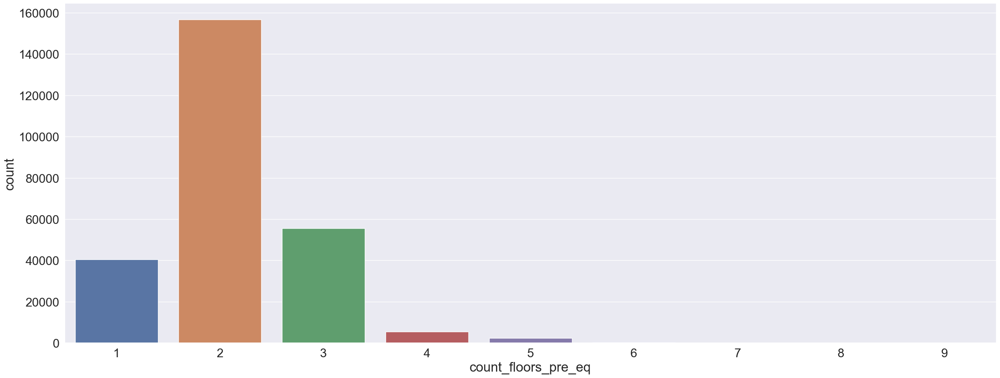

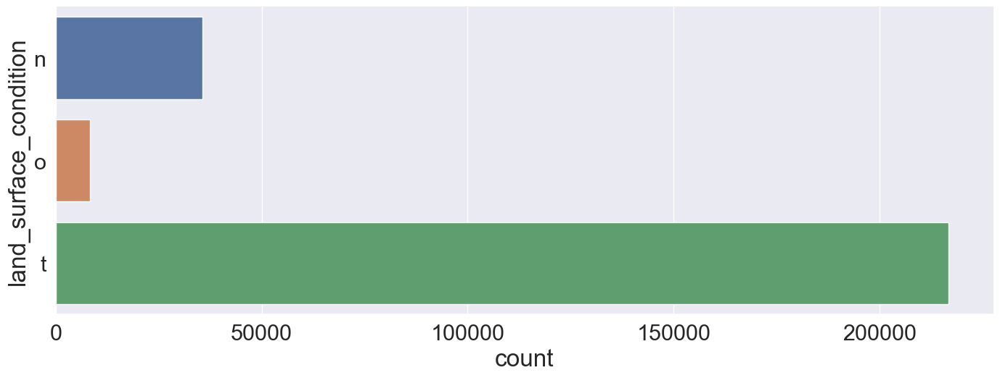

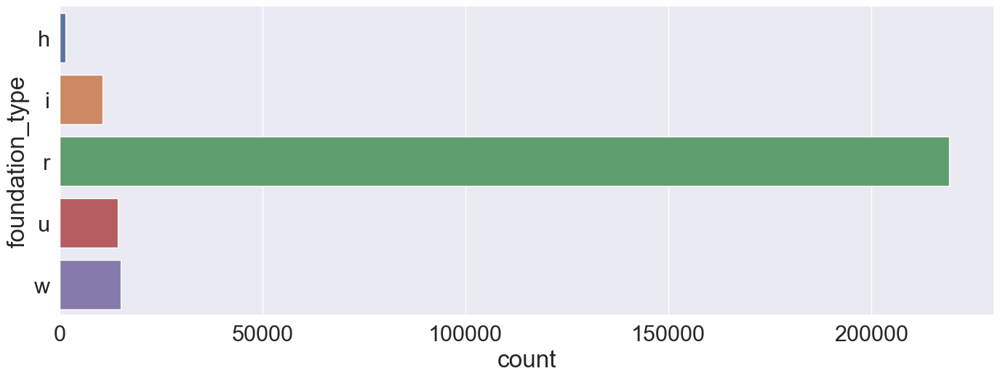

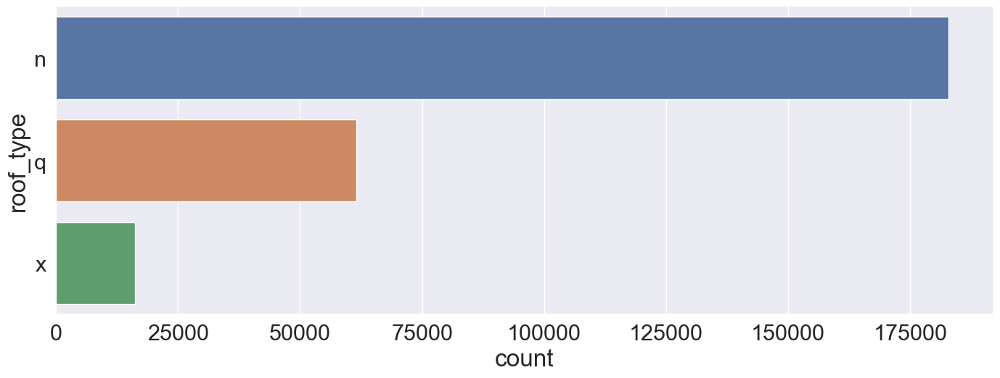

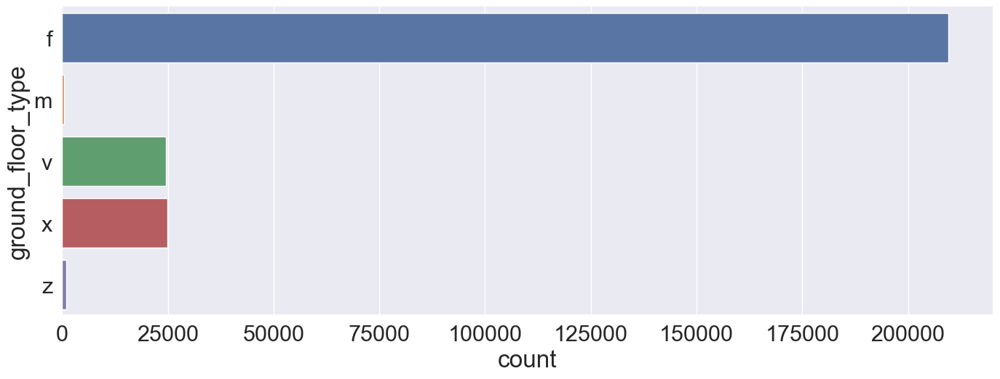

...

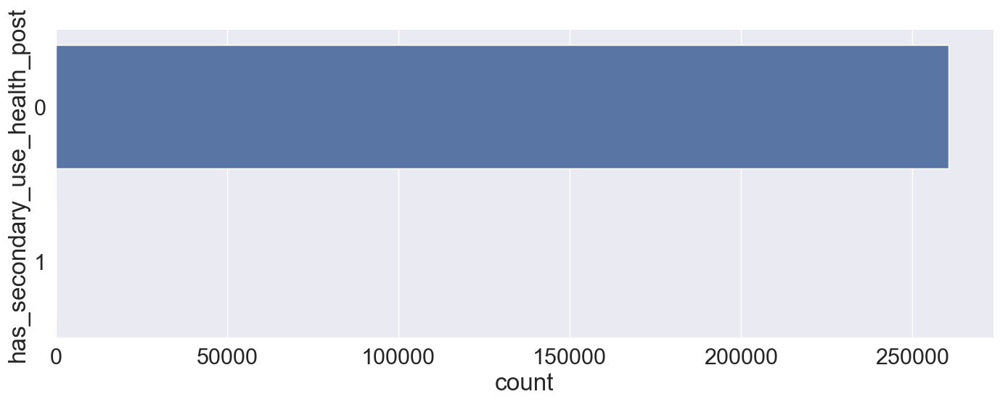

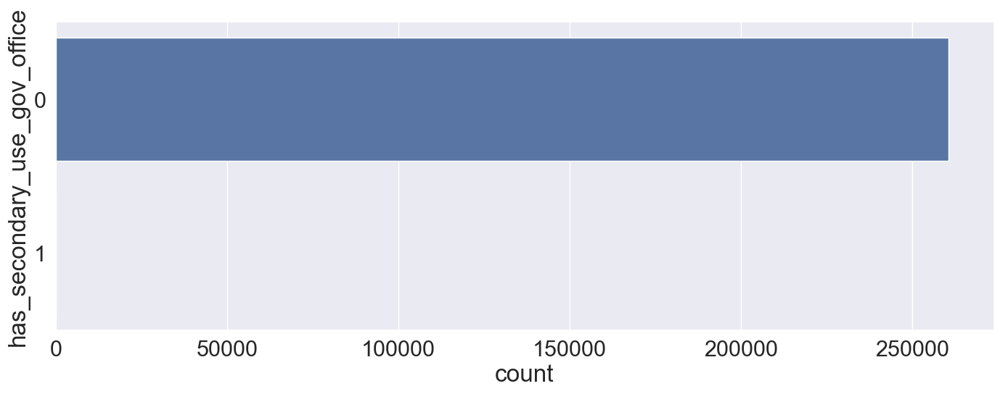

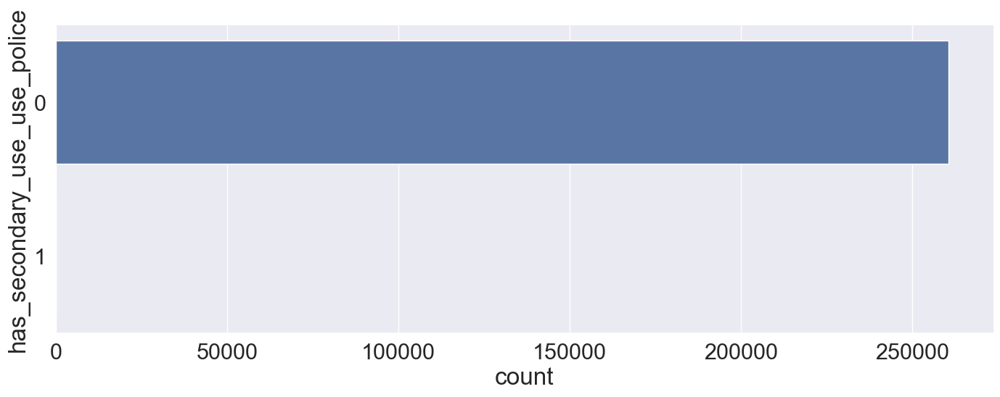

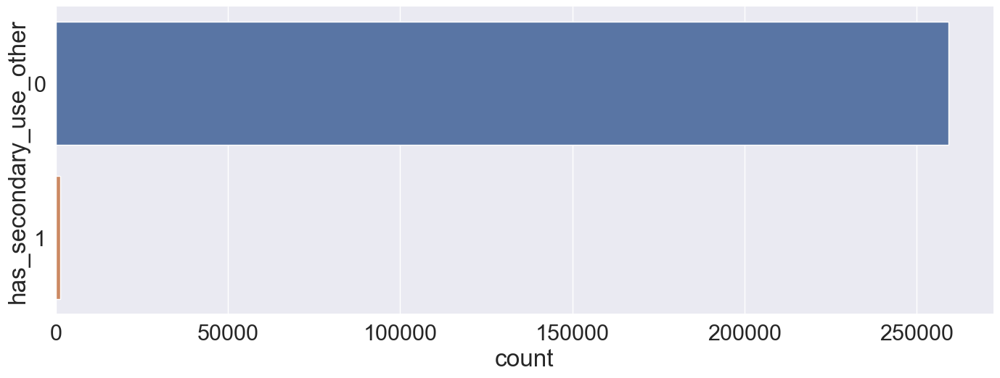

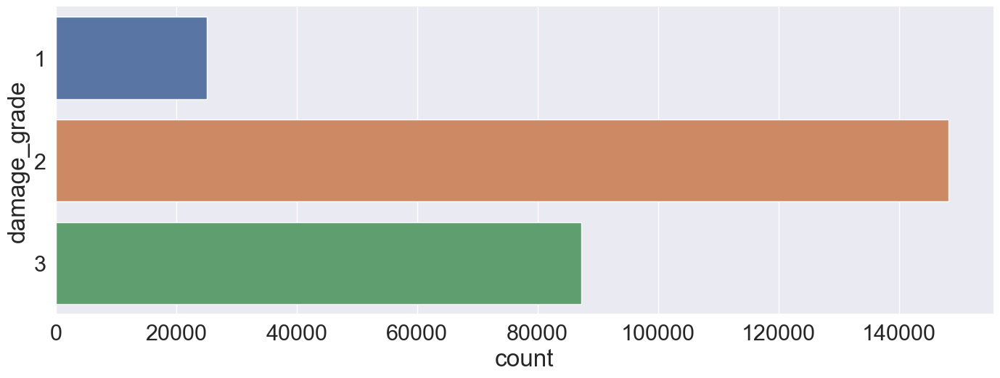

In [28]:
# Seperate variable that has more than 5 unique values

many_unique = []
for i in df_cat:
    if df_cat[i].nunique() > 5:
        many_unique.append(i)  
        
# Count Plot

for i in df_cat:
    if i in many_unique:
        g = sns.catplot(x = i, data = df, kind = "count", size = 10)
        g.fig.set_size_inches(30, 10)
    else:
        g = sns.catplot(y = i, data = df, kind = "count", size = 10)
        g.fig.set_size_inches(15, 5)

In [25]:
for i in df_cat:
    print(f"{i}")
    print(f"Number of unique value: {df_cat[i].nunique()}")
    print(df_cat[i].value_counts())
    print()

count_floors_pre_eq
Number of unique value: 9
2    156623
3     55617
1     40441
4      5424
5      2246
6       209
7        39
8         1
9         1
Name: count_floors_pre_eq, dtype: int64

land_surface_condition
Number of unique value: 3
t    216757
n     35528
o      8316
Name: land_surface_condition, dtype: int64

foundation_type
Number of unique value: 5
r    219196
w     15118
u     14260
i     10579
h      1448
Name: foundation_type, dtype: int64

roof_type
Number of unique value: 3
n    182842
q     61576
x     16183
Name: roof_type, dtype: int64

ground_floor_type
Number of unique value: 5
f    209619
x     24877
v     24593
z      1004
m       508
Name: ground_floor_type, dtype: int64

other_floor_type
Number of unique value: 4
q    165282
x     43448
j     39843
s     12028
Name: other_floor_type, dtype: int64

position
Number of unique value: 4
s    202090
t     42896
j     13282
o      2333
Name: position, dtype: int64

plan_configuration
Number of unique value: 10
d  

From Observation:
1. Most houses have only 1 family
2. There are only small amount of houses that has secondary usage

### Bi-Variate Analysis

C:\Users\reyna\AppData\Local\Temp\ipykernel_11724\3850673302.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axes = plt.subplots(1, 1, figsize=(18,6))


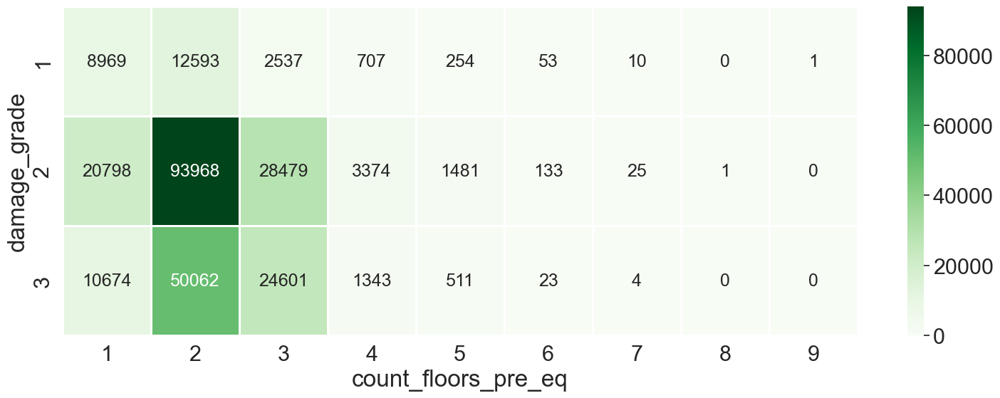

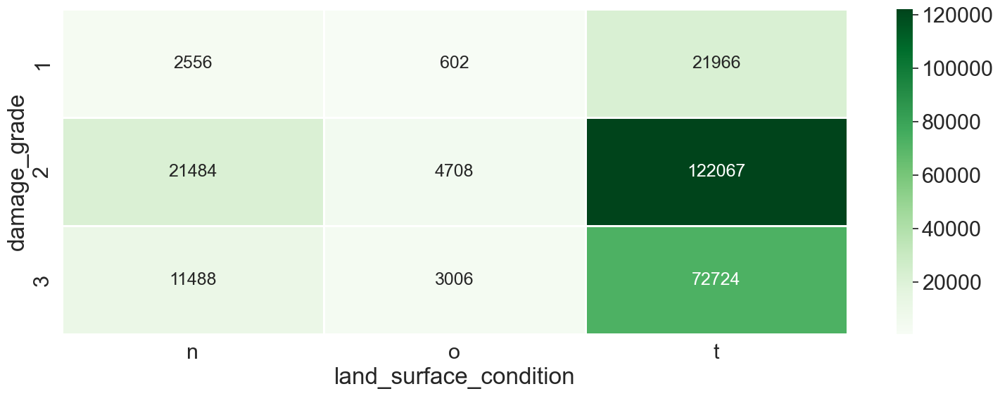

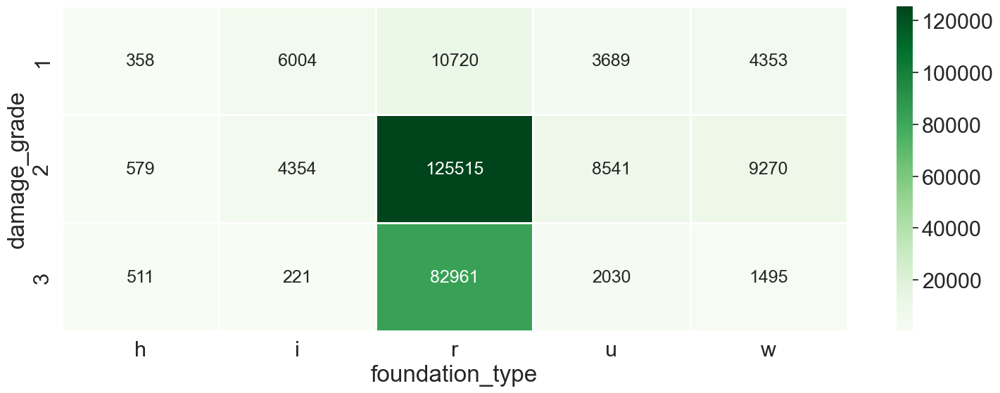

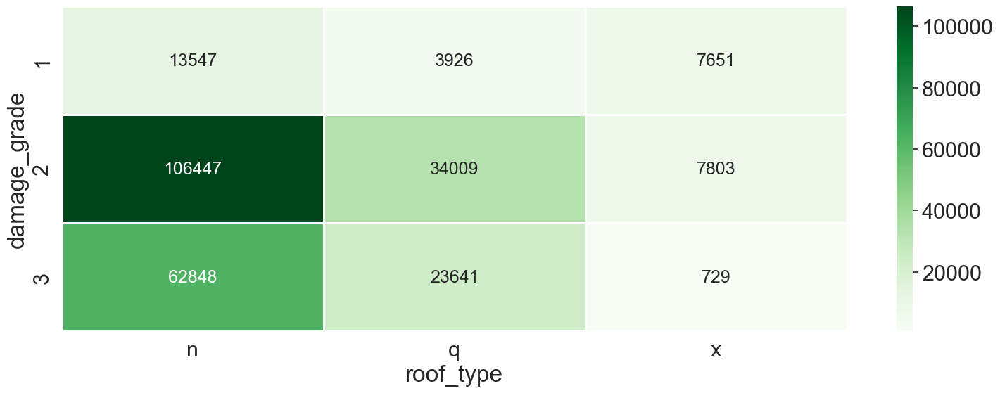

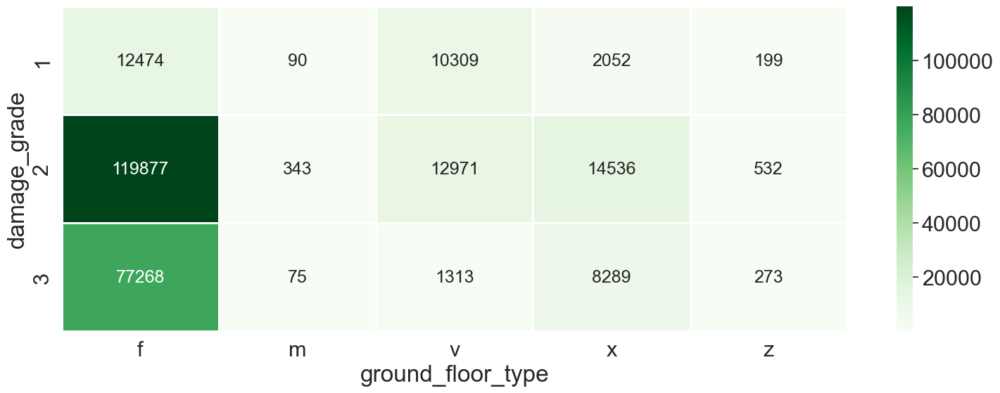

...

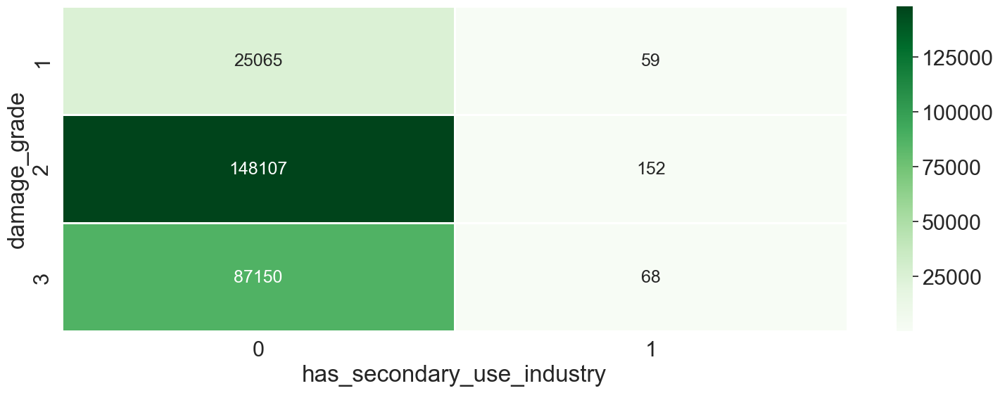

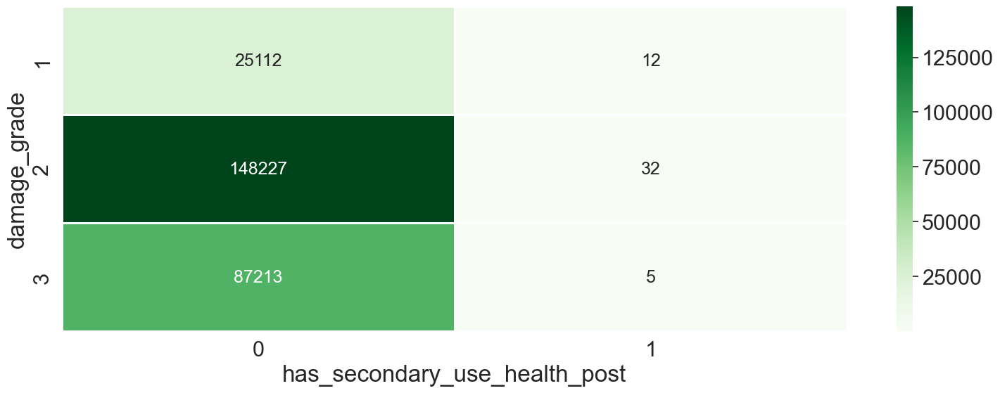

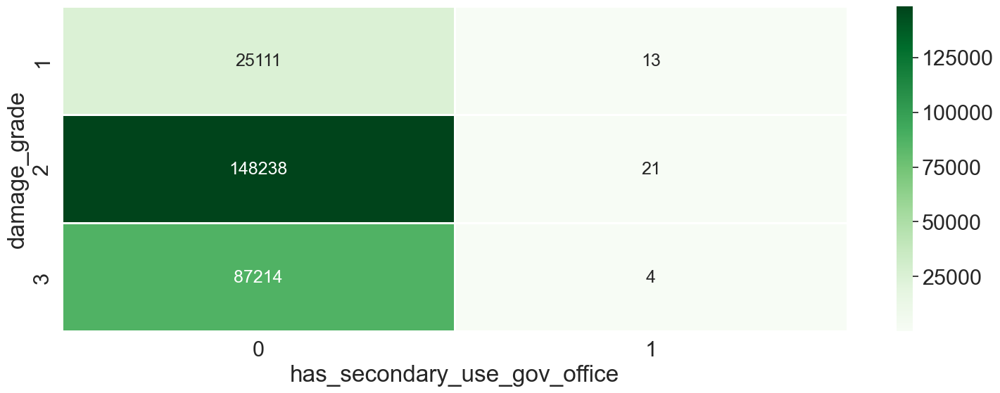

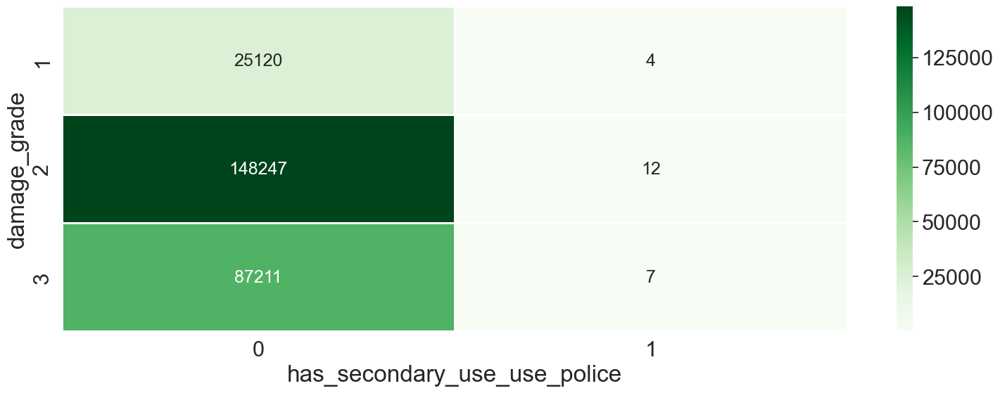

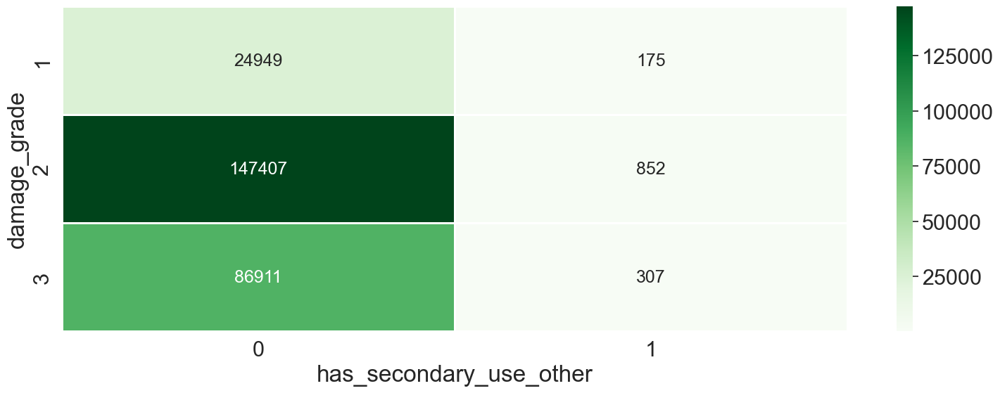

In [29]:
# Heatmap of correlation between damage_grade with other variables

for i in df_cat:
    if i == 'damage_grade':
        continue
    f, axes = plt.subplots(1, 1, figsize=(18,6))
    sns.heatmap(df_cat.groupby([i,df_cat['damage_grade']]).size().unstack().transpose(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "Greens", fmt = '.6g')

#### From Observation:
1. Houses that have a secondary use is more likely to be destroyed

Houses with no secondary usage <br>
Level 1 = 9.02 % <br>
Level 2 = 56.4 % <br>
Level 3 = 34.58% <br>

House with secondary usage <br>
Level 1 = 14.57% <br>
Level 2 = 60.76% <br>
Level 3 = 24.67% <br>

2. The Biggest amount of destuction is caused by 2 flooor houses
3. The Biggest amount of destuction is caused by houses with 1 family

<AxesSubplot:xlabel='damage_grade', ylabel='age'>

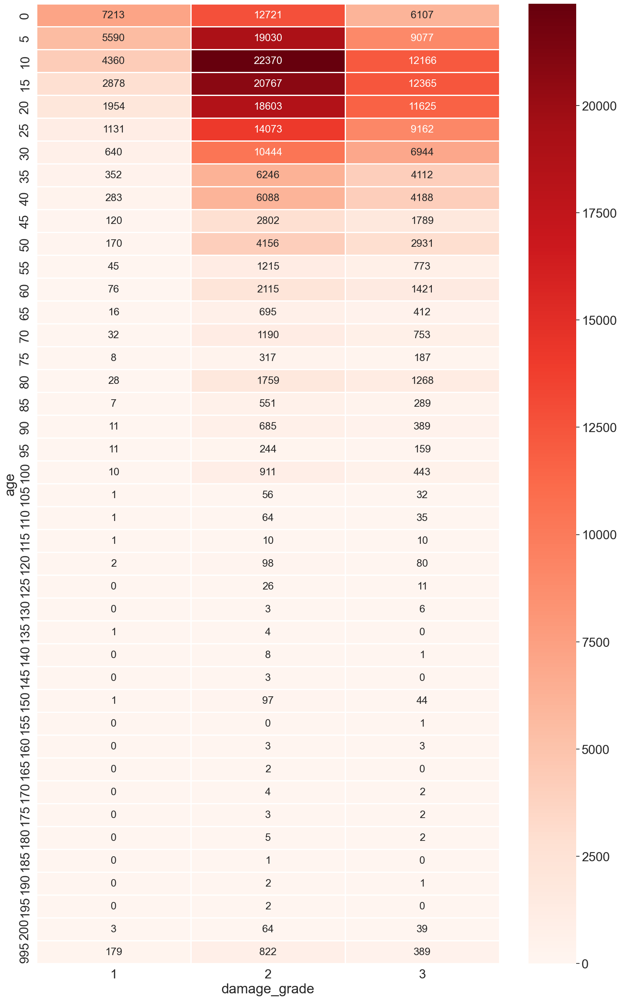

In [31]:
# Heatmap of correlation between damage_grade with age

f, axes = plt.subplots(1, 1, figsize=(18,30))
sns.heatmap(df_cat.groupby([df_num['age'],df_cat['damage_grade']]).size().unstack(), 
    linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "Reds", fmt = '.6g')

From Observation:

1. The house that has been there for 995 years has a destruction percentage of 59.1 % which is bigger than houses which are still 10 years old with a percentage destruction of 57.51 % at damage_grade 2
2. There are no houses aged 155-195 categorized in damage_grade 1

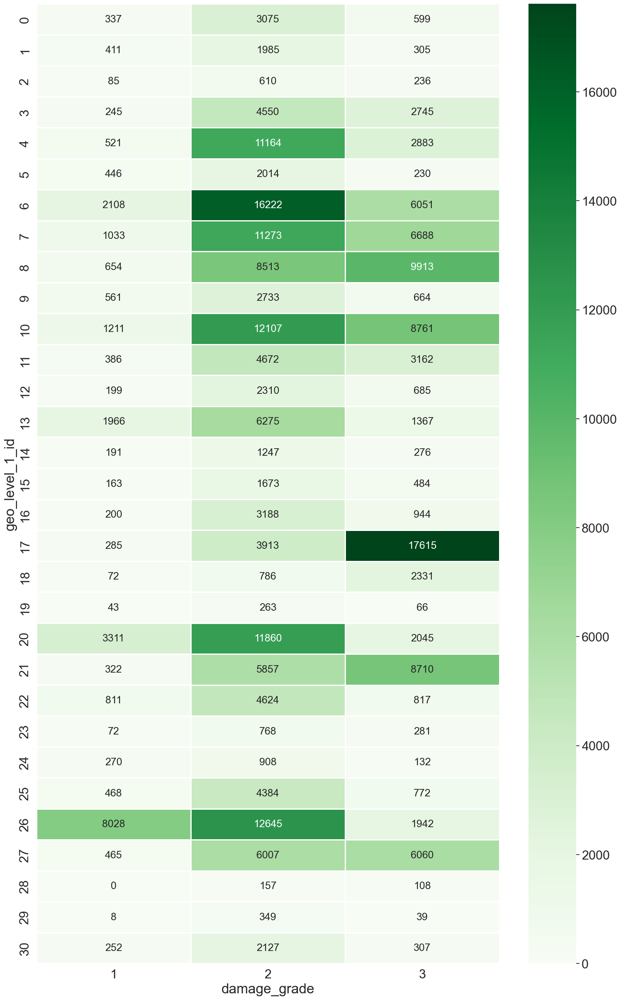

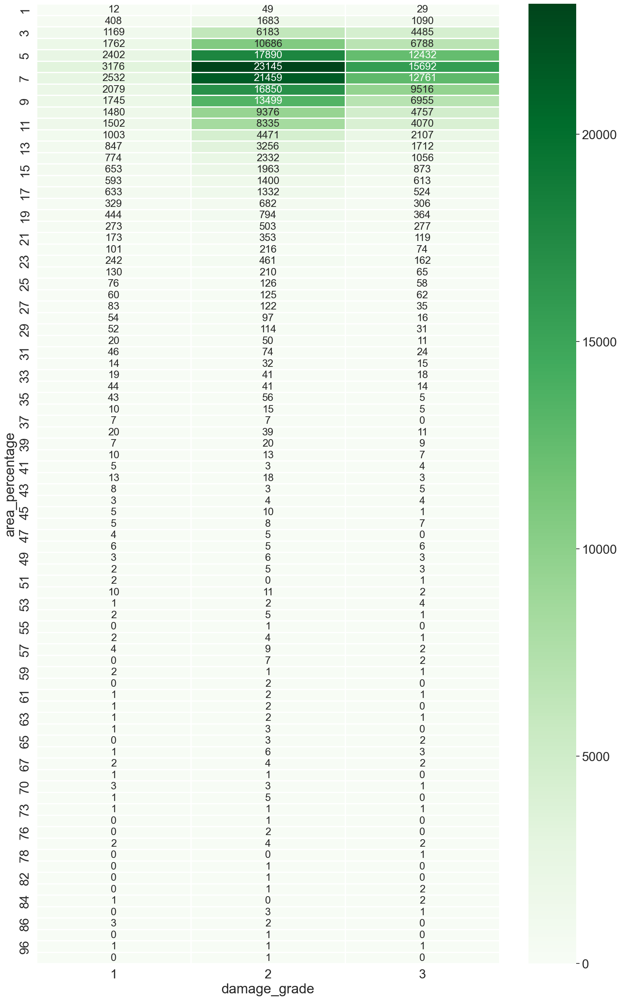

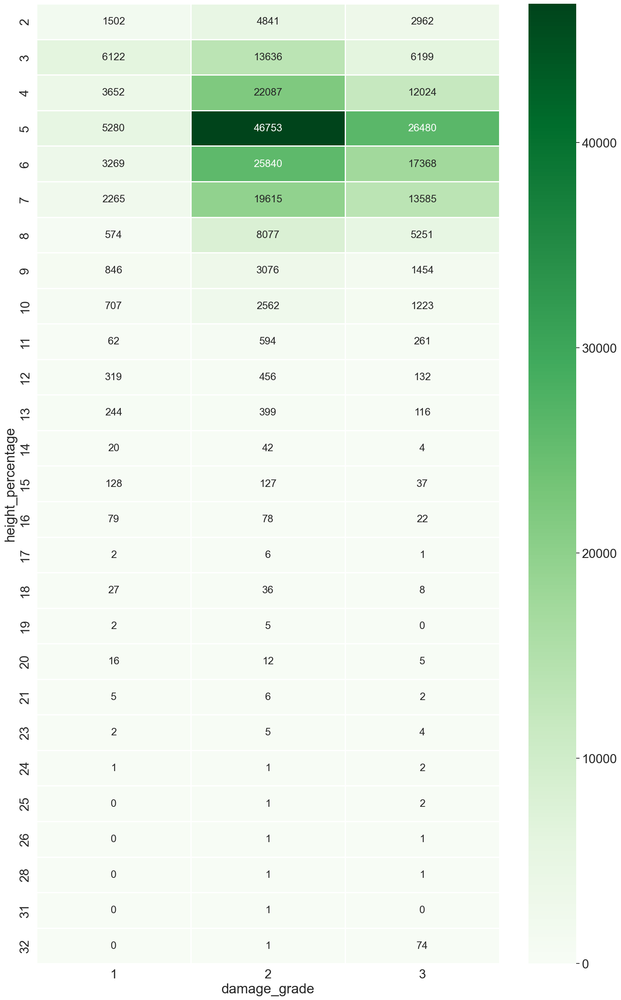

In [33]:
# Heatmap of count between damage_grade with other numerical variables

for i in df_num:
    if i == "geo_level_2_id" or i == "geo_level_3_id" or i == "age":
        continue
    f, axes = plt.subplots(1, 1, figsize=(18,30))
    sns.heatmap(df_cat.groupby([df_num[i],df_cat['damage_grade']]).size().unstack(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "Greens", fmt = '.6g')

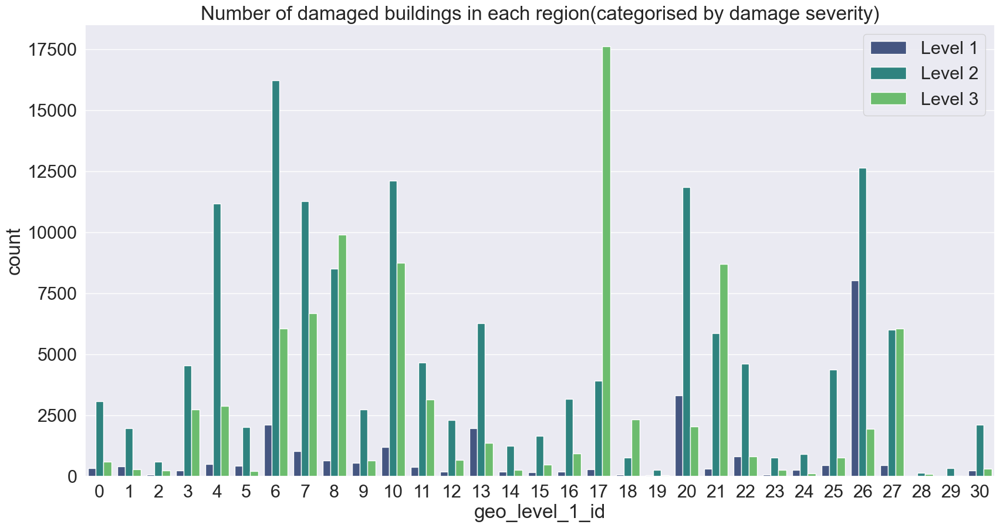

In [42]:
# countplot of geo_level_1_id and damage_grade

f = plt.figure(figsize=(20,10))
sns.countplot(x = "geo_level_1_id", hue="damage_grade", palette = 'viridis', data= df)
plt.title("Number of damaged buildings in each region(categorised by damage severity)")
plt.legend(["Level 1","Level 2","Level 3"], loc='upper right')

In [45]:
# To plot geo_level_2_id and geo_level_3_id, we need to divide it into several group
print(df_num['geo_level_2_id'].describe())
print()
print(df_num['geo_level_3_id'].describe())

count    260601.000000
mean        701.074685
std         412.710734
min           0.000000
25%         350.000000
50%         702.000000
75%        1050.000000
max        1427.000000
Name: geo_level_2_id, dtype: float64

count    260601.000000
mean       6257.876148
std        3646.369645
min           0.000000
25%        3073.000000
50%        6270.000000
75%        9412.000000
max       12567.000000
Name: geo_level_3_id, dtype: float64


# Feature Selection

We try to see how important of a certain variable and try to pick which variable we can use for machine learning <br>

In [48]:
df_num.describe()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,age,area_percentage,height_percentage
count,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,13.900353,701.074685,6257.876148,26.535029,8.018051,5.434365
std,8.033617,412.710734,3646.369645,73.565937,4.392231,1.918418
min,0.000000,0.000000,0.000000,0.000000,1.000000,2.000000
25%,7.000000,350.000000,3073.000000,10.000000,5.000000,4.000000
50%,12.000000,702.000000,6270.000000,15.000000,7.000000,5.000000
75%,21.000000,1050.000000,9412.000000,30.000000,9.000000,6.000000
max,30.000000,1427.000000,12567.000000,995.000000,100.000000,32.000000


In [49]:
df_cat.describe()

,count_floors_pre_eq,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
count,260601,260601,260601,260601,260601,260601,260601,260601,260601,260601,...,260601,260601,260601,260601,260601,260601,260601,260601,260601,260601
unique,9,3,5,3,5,4,4,10,2,2,...,2,2,2,2,2,2,2,2,2,3
top,2,t,r,n,f,q,s,d,0,1,...,0,0,0,0,0,0,0,0,0,2
freq,156623,216757,219196,182842,209619,165282,202090,250072,237500,198561,...,251838,258490,260356,260507,260322,260552,260563,260578,259267,148259


We don't need to do feature selection on numerical variable, since each of them is important and represents different meaning. <br>
Therefore, we only need to do feature selection on categorical data, since there are some variables that represents a similar meaning, such as variable that represents secondary use

### Method: Mutual Information

In [9]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif

In [18]:
cat_x = df_cat.copy().drop("damage_grade", axis = 1)
cat_y = df_cat[["damage_grade"]]

# We need to change string into integer 
for i in cat_x:
    ordinal_label = {k: i for i, k in enumerate(cat_x[i].unique(),0)}
    cat_x[i] = cat_x[i].map(ordinal_label)

In [19]:
cat_x_train, cat_x_test, cat_y_train, cay_y_test = train_test_split(cat_x, cat_y, test_size = 0.25, random_state=42)
mutual_info = mutual_info_classif(cat_x_train, cat_y_train)
mutual_info
mutual = pd.Series(mutual_info)
mutual.index = cat_x_train.columns
mutual.sort_values(ascending=False)

C:\Users\reyna\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


foundation_type                           0.071488
ground_floor_type                         0.054509
other_floor_type                          0.050016
has_superstructure_mud_mortar_stone       0.049492
roof_type                                 0.040692
has_superstructure_cement_mortar_brick    0.032614
has_superstructure_adobe_mud              0.023067
count_floors_pre_eq                       0.021721
has_superstructure_rc_engineered          0.016641
position                                  0.016150
has_superstructure_rc_non_engineered      0.012563
has_secondary_use_hotel                   0.005471
has_superstructure_stone_flag             0.004557
legal_ownership_status                    0.004231
has_secondary_use                         0.003890
has_secondary_use_rental                  0.003796
plan_configuration                        0.003655
has_superstructure_timber                 0.003255
count_families                            0.002815
has_superstructure_bamboo      

We can take top 5 features which has the highest correlation

In [20]:
features_mutual = ['foundation_type','ground_floor_type','has_superstructure_mud_mortar_stone','other_floor_type','roof_type']
fm = df_cat[features_mutual] 
fm['damage_grade'] = df_cat['damage_grade']

df_mutual = pd.concat([df_num,fm], axis =1)
df_mutual.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 13 columns):
 #   Column                               Non-Null Count   Dtype   
---  ------                               --------------   -----   
 0   building_id                          260601 non-null  int64   
 1   geo_level_1_id                       260601 non-null  int64   
 2   geo_level_2_id                       260601 non-null  int64   
 3   geo_level_3_id                       260601 non-null  int64   
 4   age                                  260601 non-null  int64   
 5   area_percentage                      260601 non-null  int64   
 6   height_percentage                    260601 non-null  int64   
 7   foundation_type                      260601 non-null  category
 8   ground_floor_type                    260601 non-null  category
 9   has_superstructure_mud_mortar_stone  260601 non-null  category
 10  other_floor_type                     260601 non-null  category
 11  

C:\Users\reyna\AppData\Local\Temp\ipykernel_13116\2566463245.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  fm['damage_grade'] = df_cat['damage_grade']


# Machine Learning

### Sampling
To minimize running time, we will do sampling (about 1% of the original dataset)

In [21]:
# Turn all string elements into integers

for i in df_cat:
    if i == "damage_grade":
        continue
    ordinal_label = {k: i for i, k in enumerate(df_cat[i].unique(),0)}
    df_cat[i] = df_cat[i].map(ordinal_label)

In [22]:
df2 = pd.concat([df_num,df_cat], axis =1)
df_scale = df2.sample(frac = 0.01, random_state = 42)
df_scale.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2606 entries, 111801 to 46852
Data columns (total 40 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   building_id                             2606 non-null   int64   
 1   geo_level_1_id                          2606 non-null   int64   
 2   geo_level_2_id                          2606 non-null   int64   
 3   geo_level_3_id                          2606 non-null   int64   
 4   age                                     2606 non-null   int64   
 5   area_percentage                         2606 non-null   int64   
 6   height_percentage                       2606 non-null   int64   
 7   count_floors_pre_eq                     2606 non-null   category
 8   land_surface_condition                  2606 non-null   category
 9   foundation_type                         2606 non-null   category
 10  roof_type                               26

In [80]:
# Seperate both full and sampling dataset into Predictors and Response variable

X = df2.copy().drop("damage_grade", axis = 1)
X = X.drop('building_id', axis =1)
Y = df2[['damage_grade']]
x = df_scale.copy().drop("damage_grade", axis = 1)
y = df_scale[['damage_grade']]

Now, we will create a train and test dataset that will be used for our machine learning models. <br>
This is to avoid bias when comparing the accuracy of the algorithms. <br>
However, we first need to determine what is the best split for the train and test dataset. <br>
To do that, we decide to compare decision tree model accuracy for our sampling dataset.<br>
We will test 5 different split, from 10% to 30%

In [34]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix

In [21]:
split_arr = [] # Accuracy List every split
split_list = [0.1,0.15,0.2,0.25,0.3]
for split in split_list:
    arr_test = [] # Accuracy List every max_depth
    for i in range(2,20): # Iterate max depth from 2 to 20
        temp_test = []
        for j in range(50): # Run the test 50 times and take the mean value
            x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.2, random_state = 42)
            dt = DecisionTreeClassifier(max_depth = i)
            dt.fit(x_train, y_train)
            y_test_pred = dt.predict(x_test)
            temp_test.append(dt.score(x_test, y_test))
            
        arr_test.append(np.mean(temp_test)) # Append every mean accuracy for each depth
        
    split_arr.append(np.max(arr_test)) # Find the max accuracy (from all depth) for each split

The best split is 10% with accuracy = 0.6679310344827585


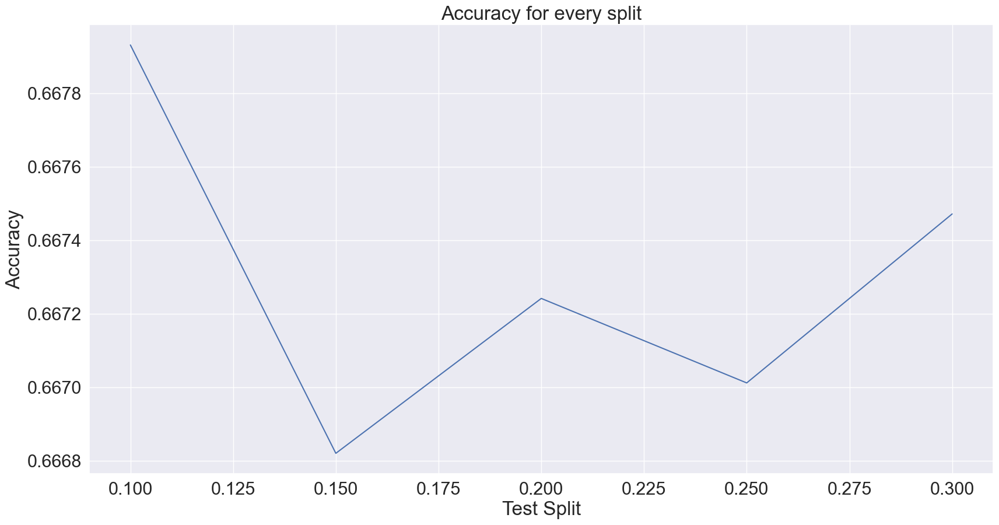

In [26]:
f, axes = plt.subplots(1, 1, figsize=(20,10))
plt.plot(split_list, split_arr)
plt.title("Accuracy for every split")
plt.xlabel('Test Split')
plt.ylabel('Accuracy')
print(f'The best split is {np.argmax(split_arr)*5+10}% with accuracy = {np.max(split_arr)}')

From this, we can see the best test split is 10% <br>
Now, we can seperate our data based on this

In [82]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.1, random_state = 42) # Full dataset
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.1, random_state = 42) # Sampling dataset

#### For Machine Learning, we are going to make 6 different models, some of which using cross validation to optimize the paramaters, namely
1. Decision Tree (Normal Iteration + Grid Search CV)
2. Random Forest (Normal Iteration + Randomized Search CV)
3. K Nearest Neighbors (Normal Iteration)
4. Naive Bayes (Normal Iteration and Grid Search)
5. Artificial Neural Network
6. Ensemble Method (Voting)

#### To decide which one is the best, we will compare their accuracies using 3 scoring methods:
1. ML score (Compare x and y)
2. F1 score (Precission and Recall have the same proportion)
3. accuracy score (Compare y_pred and y_test)

#### **However for iteration, we will only look at ML score, since it measures how accurate that specific model is

In [15]:
from sklearn.metrics import f1_score, accuracy_score

In [1]:
# Create a list that will contains accuracy of all machine learning algorithm for train and test
ml_train_acc, ml_test_acc = [],[] # ML score
f1_train_acc, f1_test_acc = [],[] # F1 score
arr_train_acc, arr_test_acc = [],[] # Accuracy score

## Method 1A: Decision Tree (Max_depth Iteration)
In this method, we do manual iteration for parameter max_depth for decision tree

The best depth is 14 with accuracy = 0.7020452016423009


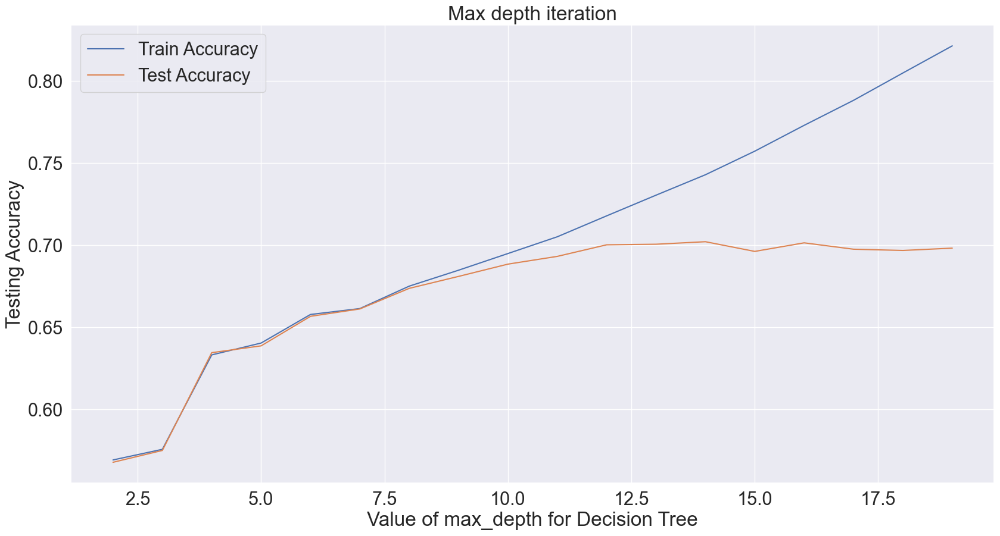

In [18]:
arr_train = []
arr_test = []
for i in range(2,20):
    temp_train = []
    temp_test = []
    for j in range(10): # Run the test 10 times and take the mean value
        dt = DecisionTreeClassifier(max_depth = i, random_state = 42)
        dt.fit(X_train, Y_train)
        y_train_pred = dt.predict(X_train)
        y_test_pred = dt.predict(X_test)
        temp_train.append(dt.score(X_train, Y_train))
        temp_test.append(dt.score(X_test, Y_test))
    
    arr_train.append(np.mean(temp_train))
    arr_test.append(np.mean(temp_test))

print(f'The best depth is {np.argmax(arr_test)+2} with accuracy = {np.max(arr_test)}')
f, axes = plt.subplots(1, 1, figsize=(20,10))
plt.plot(range(2,20), arr_train, range(2,20), arr_test)
plt.title("Max depth iteration")
plt.xlabel('Value of max_depth for Decision Tree')
plt.ylabel('Testing Accuracy')
plt.legend(['Train Accuracy', 'Test Accuracy'])

ML Score:
Train accuracy = 0.7428455700520167
Test accuracy = 0.7020452016423008

F1 Score:
Train accuracy = 0.7361448992944285
Test accuracy = 0.6935518569030472

Accuracy Score:
Train accuracy = 0.7428455700520167
Test accuracy = 0.7020452016423008


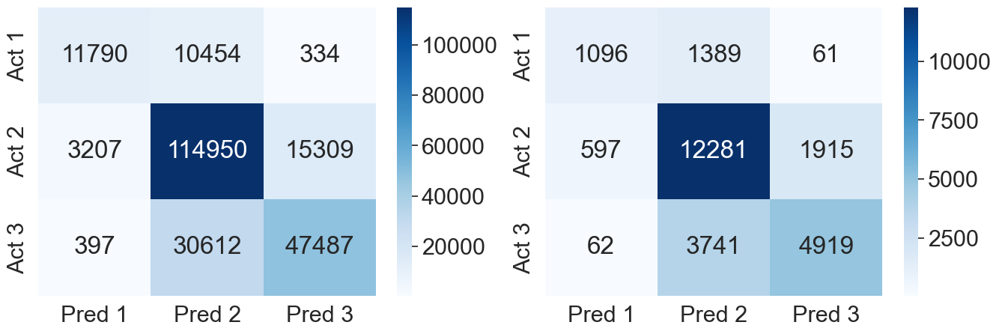

In [76]:
# Then, test on the real dataset
dt = DecisionTreeClassifier(max_depth = 14, random_state = 42)
dt.fit(X_train, Y_train)
dt_train_pred = dt.predict(X_train)
dt_test_pred = dt.predict(X_test)

# ML Score
ml_train_acc.append(dt.score(X_train, Y_train))
ml_test_acc.append(dt.score(X_test, Y_test))

# F1 Score
f1_train_acc.append(f1_score(Y_train, dt_train_pred, average="weighted"))
f1_test_acc.append(f1_score(Y_test, dt_test_pred, average="weighted"))

# Accuracy Score
arr_train_acc.append(accuracy_score(Y_train, dt_train_pred))
arr_test_acc.append(accuracy_score(Y_test, dt_test_pred))

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, dt_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, dt_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {dt.score(X_train, Y_train)}')
print(f'Test accuracy = {dt.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, dt_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, dt_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, dt_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, dt_test_pred)}')

## Method 1B: Decision Tree + GridSearch CV
In this method, we will try to select a set of hyperparameters using GridSearchCV

In [77]:
from sklearn.model_selection import GridSearchCV

In [78]:
# Initialize parameters to tune 
param_grid = {'criterion': ['gini', 'entropy'],
              'max_depth': [int(x) for x in np.linspace(2, 20, num = 19)] + [None],
              'min_samples_split': [2, 4, 6, 8, 10],
              'min_samples_leaf': [1, 2, 4],
              'max_features': ['sqrt', 'log2', None]}

# Use 5 Cross Validations and set scoring to accuracy to get the best accuracy
dtc = DecisionTreeClassifier(random_state=42)
dtc = GridSearchCV(estimator=dtc, param_grid=param_grid, cv=5, n_jobs=-1, scoring = 'accuracy')
dtc.fit(x_train,y_train.values.ravel())
dtc.best_params_

{'criterion': 'gini',
 'max_depth': 6,
 'max_features': None,
 'min_samples_leaf': 4,
 'min_samples_split': 2}

ML Score:
Train accuracy = 0.6577044427389784
Test accuracy = 0.6565749587506235

F1 Score:
Train accuracy = 0.6223142270209604
Test accuracy = 0.6206090543253069

Accuracy Score:
Train accuracy = 0.6577044427389784
Test accuracy = 0.6565749587506235


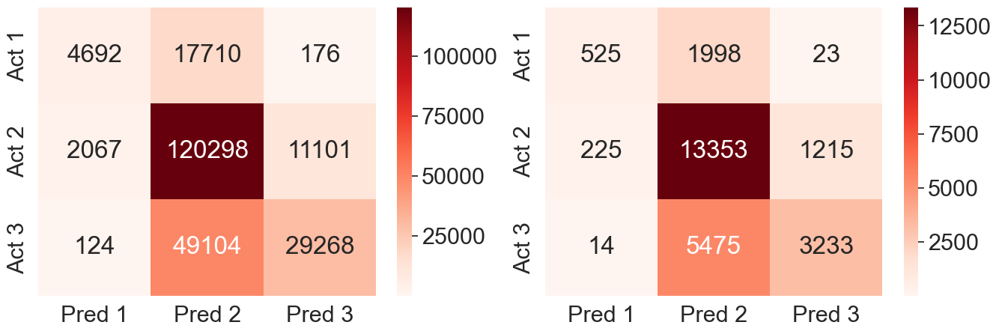

In [79]:
# Insert those parameters in our model and use it on the actual dataset
dtc = DecisionTreeClassifier(random_state=42, **dtc.best_params_)
dtc.fit(X_train, Y_train)
dtc_train_pred = dtc.predict(X_train)
dtc_test_pred = dtc.predict(X_test)

# ML Score
ml_train_acc.append(dtc.score(X_train, Y_train))
ml_test_acc.append(dtc.score(X_test, Y_test))

# F1 Score
f1_train_acc.append(f1_score(Y_train, dtc_train_pred, average="weighted"))
f1_test_acc.append(f1_score(Y_test, dtc_test_pred, average="weighted"))

# Accuracy Score
arr_train_acc.append(accuracy_score(Y_train, dtc_train_pred))
arr_test_acc.append(accuracy_score(Y_test, dtc_test_pred))

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, dtc_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, dtc_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {dtc.score(X_train, Y_train)}')
print(f'Test accuracy = {dtc.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, dtc_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, dtc_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, dtc_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, dtc_test_pred)}')

### Observation:
We can see that Decison tree without GridSearch gets higher accuracy around 70.2% from Accuracy score and 69.35% from f1 score

## Method 2A: Random Forest (n_estimators Iteration)
In this method, we will use RandomForest Classifier and manually iterate the n_estimators to get the best parameter value

In [81]:
from sklearn.ensemble import RandomForestClassifier

The best n_estimators is 52 with accuracy = 0.6781609195402298



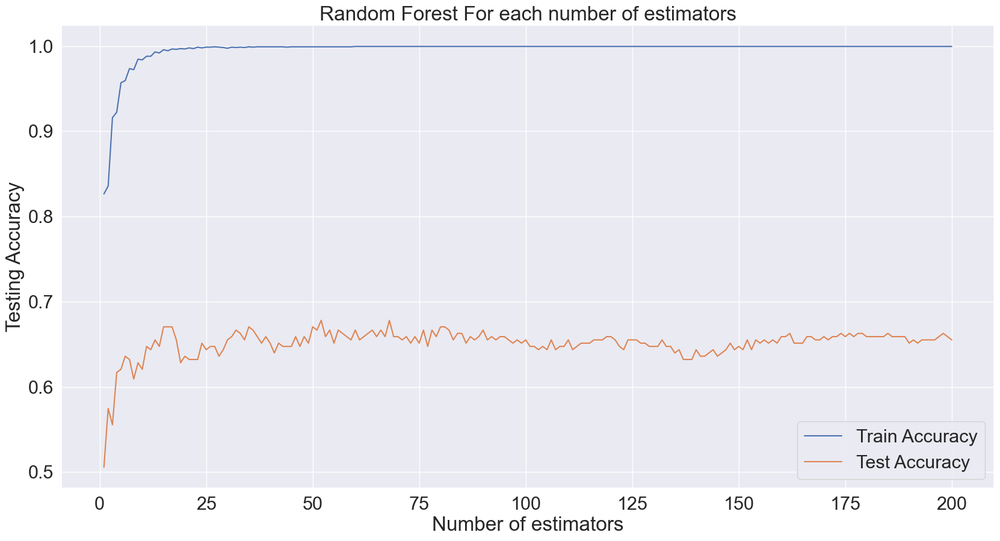

In [85]:
# Iterate 1% of the data to find best number of estimators

arr_train = []
arr_test = []
for i in range(1,201): # Iterate every n_estimators
    temp_train = []
    temp_test = []
    for j in range(5): # Run the test 5 times
        x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.1, random_state = 42)
        rf = RandomForestClassifier(n_estimators = i, random_state = 42)
        rf.fit(x_train, y_train.values.ravel())
        y_train_pred = rf.predict(x_train)
        y_test_pred = rf.predict(x_test)
        temp_train.append(rf.score(x_train, y_train))
        temp_test.append(rf.score(x_test, y_test))
    
    arr_train.append(np.mean(temp_train))
    arr_test.append(np.mean(temp_test))

# Visualize
f, axes = plt.subplots(1, 1, figsize=(20,10))
plt.plot(range(1,201), arr_train, range(1,201), arr_test)
plt.title("Random Forest For each number of estimators")
plt.xlabel('Number of estimators')
plt.ylabel('Testing Accuracy')
plt.legend(['Train Accuracy', 'Test Accuracy'])
print(f'The best n_estimators is {np.argmax(arr_test)+1} with accuracy = {np.max(arr_test)}')
print()

ML Score:
Train accuracy = 0.9852306642790143
Test accuracy = 0.720501899389893

F1 Score:
Train accuracy = 0.9852253327286582
Test accuracy = 0.7149974767253996

Accuracy Score:
Train accuracy = 0.9852306642790143
Test accuracy = 0.720501899389893


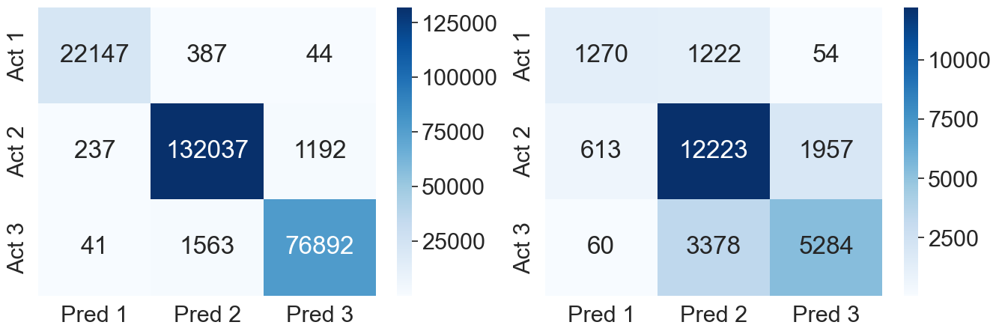

In [87]:
# Then, test on the real dataset
rf = RandomForestClassifier(n_estimators = 52, random_state = 42)
rf.fit(X_train, Y_train.values.ravel())
rf_train_pred = rf.predict(X_train)
rf_test_pred = rf.predict(X_test)

# ML Score
ml_train_acc.append(rf.score(X_train, Y_train))
ml_test_acc.append(rf.score(X_test, Y_test))

# F1 Score
f1_train_acc.append(f1_score(Y_train, rf_train_pred, average="weighted"))
f1_test_acc.append(f1_score(Y_test, rf_test_pred, average="weighted"))

# Accuracy Score
arr_train_acc.append(accuracy_score(Y_train, rf_train_pred))
arr_test_acc.append(accuracy_score(Y_test, rf_test_pred))

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, rf_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, rf_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {rf.score(X_train, Y_train)}')
print(f'Test accuracy = {rf.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, rf_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, rf_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, rf_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, rf_test_pred)}')

## Method 2B: Random Forest + RandomizedSearchCV
In this method we will use RandomizedSearchCV to find the hyperparameters for RandomForest Classifier<br>
We won't be using GridSearchCV for this model as it requires a lot of computational power and really time consuming (which might take hours or even days to finish)<br>
RandomSearch Cross Validation selects the parameter values at random multiple times and find the best ones at the end, while GridSearchCV computes every possible combination of parameters and outputs the best ones

In [90]:
from sklearn.model_selection import RandomizedSearchCV

In [132]:
# Initialize parameters to tune
param_dist = {"n_estimators": [50, 100, 200, 400],
              "max_depth": [2, 5, 10, 15, 20, 30, None],
              "min_samples_split": [2, 3, 5],
              "min_samples_leaf": [1, 2, 4],
              "max_features": ["auto", "sqrt", "log2", None],
              "bootstrap": [True, False],
              "criterion": ["gini", "entropy"]}

# Use 3 Cross Validation and set scoring to accuracy to get the best accuracy
rfc = RandomForestClassifier(random_state=42)
rfc_random = RandomizedSearchCV(estimator=rfc, param_distributions=param_dist, n_iter=100, cv=3, n_jobs=-1, random_state=42, scoring = "accuracy")
rfc_random.fit(x_train, y_train.values.ravel())
rfc_random.best_params_

{'n_estimators': 200,
 'min_samples_split': 5,
 'min_samples_leaf': 4,
 'max_features': None,
 'max_depth': 15,
 'criterion': 'entropy',
 'bootstrap': True}

ML Score:
Train accuracy = 0.7555214462351838
Test accuracy = 0.719696097617129

F1 Score:
Train accuracy = 0.7474636236933772
Test accuracy = 0.7096582112407331

Accuracy Score:
Train accuracy = 0.7555214462351838
Test accuracy = 0.719696097617129


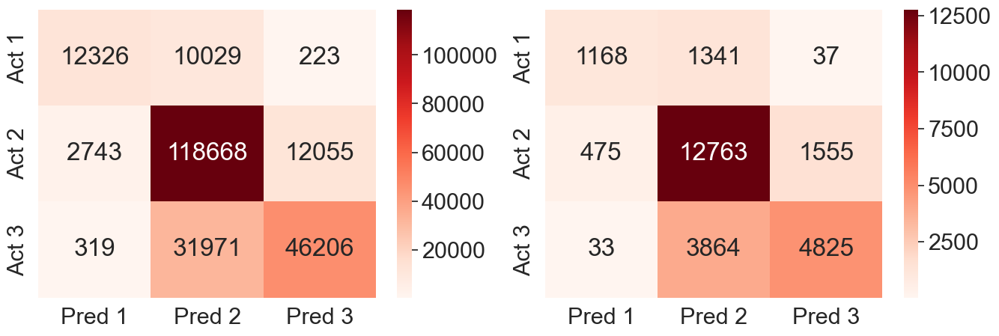

In [97]:
# Use those parameters on the actual dataset
rfc = RandomForestClassifier(random_state=42, **rfc_random.best_params_)
rfc.fit(X_train, Y_train.values.ravel())
rfc_train_pred = rfc.predict(X_train)
rfc_test_pred = rfc.predict(X_test)

# ML Score
ml_train_acc.append(rfc.score(X_train, Y_train))
ml_test_acc.append(rfc.score(X_test, Y_test))

# F1 Score
f1_train_acc.append(f1_score(Y_train, rfc_train_pred, average="weighted"))
f1_test_acc.append(f1_score(Y_test, rfc_test_pred, average="weighted"))

# Accuracy Score
arr_train_acc.append(accuracy_score(Y_train, rfc_train_pred))
arr_test_acc.append(accuracy_score(Y_test, rfc_test_pred))

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, rfc_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, rfc_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {rfc.score(X_train, Y_train)}')
print(f'Test accuracy = {rfc.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, rfc_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, rfc_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, rfc_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, rfc_test_pred)}')

### Observation:
We can see that Random Forest without GridSearch gets higher accuracy around 72.05% from Accuracy score and 71.49% from f1 score

## Method 3: K Nearest Neighbors
In this method, we will iterate number of neighbors (k) to get the highest accuracy<br>
We don't use grid search on this algorithm, since there's only 1 parameter to tune

In [98]:
from sklearn.neighbors import KNeighborsClassifier

C:\Users\reyna\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\reyna\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

The best k is 56 with accuracy = 0.6015325670498084



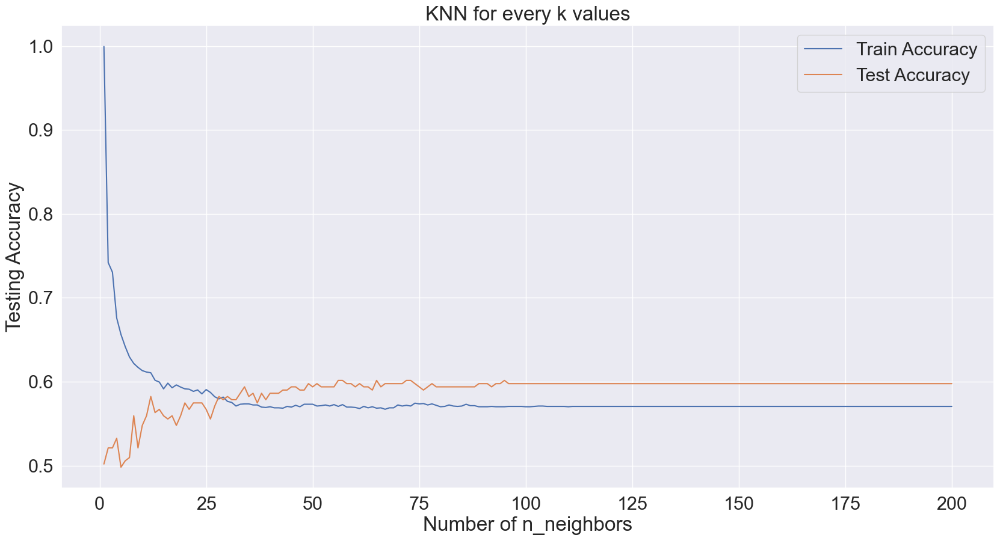

In [99]:
# Iterate 1% of the data to find best k value

arr_train = []
arr_test = []
for k in range(1,201): # Iterate every k
    temp_train = []
    temp_test = []
    for j in range(10): # Run the test 10 times
        x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.1, random_state = 42)
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(x_train, y_train.values.ravel())
        y_train_pred = knn.predict(x_train)
        y_test_pred = knn.predict(x_test)
        temp_train.append(knn.score(x_train, y_train))
        temp_test.append(knn.score(x_test, y_test))
    
    arr_train.append(np.mean(temp_train))
    arr_test.append(np.mean(temp_test))

# Visualize
f, axes = plt.subplots(1, 1, figsize=(20,10))
plt.plot(range(1,201), arr_train, range(1,201), arr_test)
plt.title("KNN for every k values")
plt.xlabel('Number of n_neighbors')
plt.ylabel('Testing Accuracy')
plt.legend(['Train Accuracy', 'Test Accuracy'])
print(f'The best k is {np.argmax(arr_test)+1} with accuracy = {np.max(arr_test)}')
print()

C:\Users\reyna\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\reyna\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

ML Score:


C:\Users\reyna\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Train accuracy = 0.6747420482646883


C:\Users\reyna\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Test accuracy = 0.6620237135950271

F1 Score:
Train accuracy = 0.6598055468583165
Test accuracy = 0.6458327655178924

Accuracy Score:
Train accuracy = 0.6747420482646883
Test accuracy = 0.6620237135950271


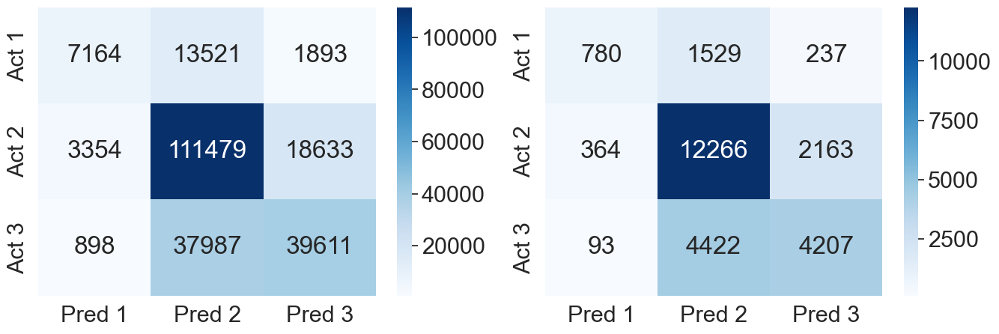

In [106]:
# Use the parameters on the actual dataset
knn = KNeighborsClassifier(n_neighbors=56)
knn.fit(X_train, Y_train.values.ravel())
knn_train_pred = knn.predict(X_train)
knn_test_pred = knn.predict(X_test)

# ML Score
ml_train_acc.append(knn.score(X_train, Y_train))
ml_test_acc.append(knn.score(X_test, Y_test))

# F1 Score
f1_train_acc.append(f1_score(Y_train, knn_train_pred, average="weighted"))
f1_test_acc.append(f1_score(Y_test, knn_test_pred, average="weighted"))

# Accuracy Score
arr_train_acc.append(accuracy_score(Y_train, knn_train_pred))
arr_test_acc.append(accuracy_score(Y_test, knn_test_pred))

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, knn_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, knn_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {knn.score(X_train, Y_train)}')
print(f'Test accuracy = {knn.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, knn_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, knn_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, knn_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, knn_test_pred)}')

From here, we can see the accuracy is around 66.2% with ML score and around 64.58% with F1 score

## Method 4A: Naive Bayes
In this method we will manually iterate value of alpha

In [124]:
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB

The best alpha is 0.7999999999999999 with accuracy = 0.4521072796934866



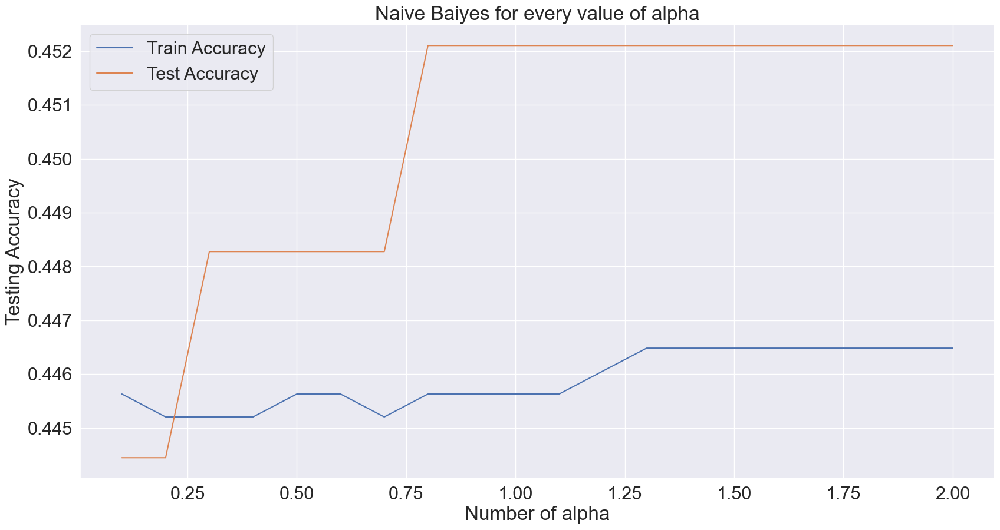

In [125]:
# Iterate 1% of the data to find best k value

arr_train = []
arr_test = []
for i in np.arange(0.1, 2.1, 0.1): # Iterate every alpha
    temp_train = []
    temp_test = []
    for j in range(10): # Run the test 10 times
        x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = 0.1, random_state = 42)
        nb = MultinomialNB(alpha = i)
        nb.fit(x_train, y_train.values.ravel())
        y_train_pred = nb.predict(x_train)
        y_test_pred = nb.predict(x_test)
        temp_train.append(nb.score(x_train, y_train))
        temp_test.append(nb.score(x_test, y_test))
    
    arr_train.append(np.mean(temp_train))
    arr_test.append(np.mean(temp_test))

# Visualize
f, axes = plt.subplots(1, 1, figsize=(20,10))
plt.plot(np.arange(0.1, 2.1, 0.1), arr_train, np.arange(0.1, 2.1, 0.1), arr_test)
plt.title("Naive Baiyes for every value of alpha")
plt.xlabel('Number of alpha')
plt.ylabel('Testing Accuracy')
plt.legend(['Train Accuracy', 'Test Accuracy'])
print(f'The best alpha is {np.argmax(arr_test)/10 +0.1} with accuracy = {np.max(arr_test)}')
print()

ML Score:
Train accuracy = 0.2805747420482647
Test accuracy = 0.27988181573999465

F1 Score:
Train accuracy = 0.26241717640974377
Test accuracy = 0.26108096608312165

Accuracy Score:
Train accuracy = 0.2805747420482647
Test accuracy = 0.27988181573999465


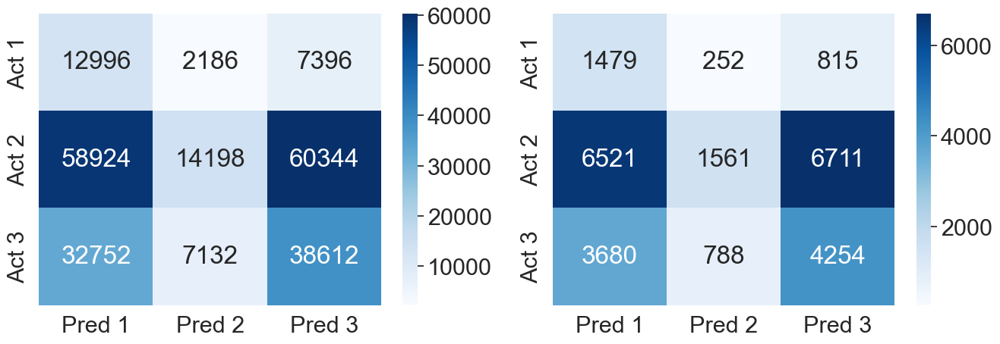

In [127]:
# Use the parameters on the actual dataset
nb = MultinomialNB(alpha = 0.8)
nb.fit(X_train, Y_train.values.ravel())
nb_train_pred = nb.predict(X_train)
nb_test_pred = nb.predict(X_test)

# ML Score
ml_train_acc.append(nb.score(X_train, Y_train))
ml_test_acc.append(nb.score(X_test, Y_test))

# F1 Score
f1_train_acc.append(f1_score(Y_train, nb_train_pred, average="weighted"))
f1_test_acc.append(f1_score(Y_test, nb_test_pred, average="weighted"))

# Accuracy Score
arr_train_acc.append(accuracy_score(Y_train, nb_train_pred))
arr_test_acc.append(accuracy_score(Y_test, nb_test_pred))

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, nb_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, nb_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {nb.score(X_train, Y_train)}')
print(f'Test accuracy = {nb.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, nb_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, nb_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, nb_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, nb_test_pred)}')

## Method 4B: Naive Bayes + GridSearchCV
In this method, we add 1 more variable to tune (fit_prior)

In [134]:
# Initialize parameters to tune
param_grid = {'alpha': np.arange(0.1, 2.1, 0.1),
              'fit_prior': [True, False]}

# Use 5 Cross Validation and set scoring to accuracy to get the best accuracy
nbc = MultinomialNB()
nbc_random = GridSearchCV(estimator=nbc, param_grid=param_grid, cv=5, n_jobs=-1, scoring = "accuracy")
nbc_random.fit(x_train, y_train.values.ravel())
nbc_random.best_params_

{'alpha': 0.7000000000000001, 'fit_prior': True}

ML Score:
Train accuracy = 0.2805747420482647
Test accuracy = 0.27988181573999465

F1 Score:
Train accuracy = 0.26241717640974377
Test accuracy = 0.26108096608312165

Accuracy Score:
Train accuracy = 0.2805747420482647
Test accuracy = 0.27988181573999465


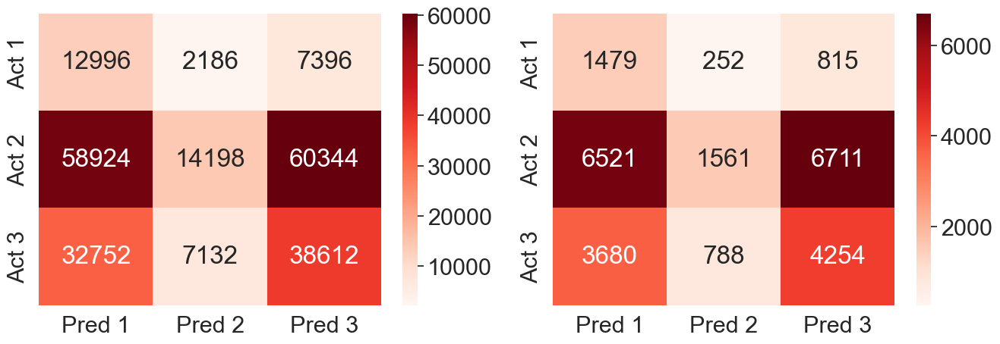

In [136]:
# Use those parameters on the actual dataset
nbc = MultinomialNB(**nbc_random.best_params_)
nbc.fit(X_train, Y_train.values.ravel())
nbc_train_pred = nbc.predict(X_train)
nbc_test_pred = nbc.predict(X_test)

# ML Score
ml_train_acc.append(nbc.score(X_train, Y_train))
ml_test_acc.append(nbc.score(X_test, Y_test))

# F1 Score
f1_train_acc.append(f1_score(Y_train, nbc_train_pred, average="weighted"))
f1_test_acc.append(f1_score(Y_test, nbc_test_pred, average="weighted"))

# Accuracy Score
arr_train_acc.append(accuracy_score(Y_train, nbc_train_pred))
arr_test_acc.append(accuracy_score(Y_test, nbc_test_pred))

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, nbc_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, nbc_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {nbc.score(X_train, Y_train)}')
print(f'Test accuracy = {nbc.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, nbc_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, nbc_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, nbc_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, nbc_test_pred)}')

### Observation:
We can see that Naive Bayes is not a good algorithm for this problem. <br>
Without GridSearch gets higher accuracy around 26%-28% and we also get similar result with using Grid Search

## Method 5: Artificial Neural Network
In this method we try to use an AI algorithm from Tensor Flow

In [20]:
import tensorflow as tf

# Build the model
model = tf.keras.Sequential([
  tf.keras.layers.Dense(200, activation='relu'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(20)
])

# Define loss function and optimizer
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
optimizer = tf.keras.optimizers.Adam()

# Compile the model
model.compile(optimizer=optimizer, loss=loss_fn, metrics=['accuracy'])

# Train the model
model.fit(X_train, Y_train, epochs=10)

# Evaluate the model on the test data
train_loss, train_acc = model.evaluate(X_train, Y_train, verbose=2)
test_loss, test_acc = model.evaluate(X_test, Y_test, verbose=2)
print('Train accuracy:', train_acc)
print('Test accuracy:', test_acc)

# Append the same value for all accuracy method, since ANN has its own accuracy scoring method

# ML Score
ml_train_acc.append(train_acc)
ml_test_acc.append(test_acc)

# F1 Score
f1_train_acc.append(train_acc)
f1_test_acc.append(test_acc)

# Accuracy Score
arr_train_acc.append(train_acc)
arr_test_acc.append(test_acc)

Epoch 1/10
7330/7330 [==============================] - 19s 3ms/step - loss: 9.0265 - accuracy: 0.5147
Epoch 2/10
7330/7330 [==============================] - 19s 3ms/step - loss: 0.8643 - accuracy: 0.5677
Epoch 3/10
7330/7330 [==============================] - 19s 3ms/step - loss: 0.8509 - accuracy: 0.5710
Epoch 4/10
7330/7330 [==============================] - 18s 2ms/step - loss: 0.8486 - accuracy: 0.5717
Epoch 5/10
7330/7330 [==============================] - 18s 2ms/step - loss: 0.8444 - accuracy: 0.5720
Epoch 6/10
7330/7330 [==============================] - 18s 2ms/step - loss: 0.8440 - accuracy: 0.5716
Epoch 7/10
7330/7330 [==============================] - 19s 3ms/step - loss: 0.8427 - accuracy: 0.5713
Epoch 8/10
7330/7330 [==============================] - 20s 3ms/step - loss: 0.8430 - accuracy: 0.5712
Epoch 9/10
7330/7330 [==============================] - 18s 2ms/step - loss: 0.8413 - accuracy: 0.5717
Epoch 10/10
7330/7330 [==============================] - 20s 3ms/step - l

## Method 6: Ensemble Methods + GridSearch CV
In this method, we will use ensemble method with grid search to find its best parameters via Voting <br>
Ensemble method is a method, which we can combine multiple algorithm to get higher accuracy<br>
In this method, we will combine top 2 highest accuracy, which are DecisionTree and RandomForest

In [146]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier

In [25]:
# Initialize the models
rf_en = RandomForestClassifier(n_estimators = 52)
dt_en = DecisionTreeClassifier(max_depth = 14)

vc = VotingClassifier(estimators=[('rf', rf_en),('dt', dt_en)])

In [42]:
# Tune the parameters
param_grid = {'voting': ['hard', 'soft'],
    'weights':[(1,1),(1,2),(2,1),(1,3),(3,1),(2,3),(3,2)]}

grid = GridSearchCV(vc, params)
grid.fit(x,y.values.ravel())
grid.best_params_

{'voting': 'soft', 'weights': (3, 1)}

ML Score:
Train accuracy = 0.9934979108041272
Test accuracy = 0.7272552856759142

F1 Score:
Train accuracy = 0.993492250756332
Test accuracy = 0.7202070780066933

Accuracy Score:
Train accuracy = 0.9934979108041272
Test accuracy = 0.7272552856759142


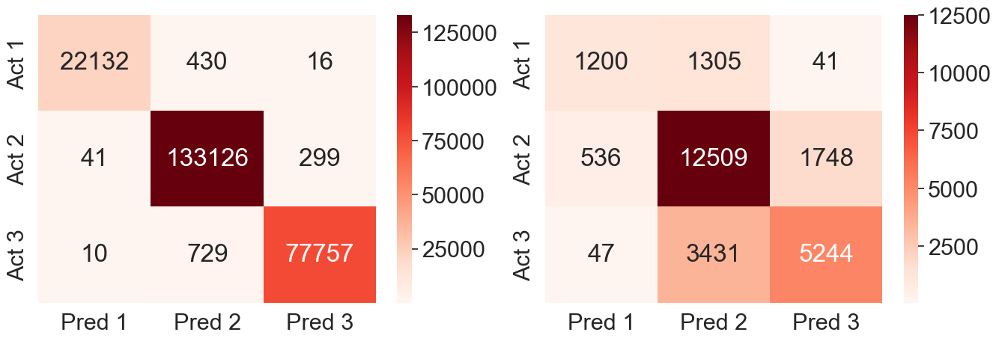

In [52]:
# Use those parameters on the actual dataset
ensemble = VotingClassifier(estimators=[('rf', rf_en), ('dt', dt_en)],
                           **grid.best_params_)
ensemble.fit(X_train, Y_train.values.ravel())
ensemble_train_pred = ensemble.predict(X_train)
ensemble_test_pred = ensemble.predict(X_test)

# ML Score
ml_train_acc.append(ensemble.score(X_train, Y_train))
ml_test_acc.append(ensemble.score(X_test, Y_test))

# F1 Score
f1_train_acc.append(f1_score(Y_train, ensemble_train_pred, average="weighted"))
f1_test_acc.append(f1_score(Y_test, ensemble_test_pred, average="weighted"))

# Accuracy Score
arr_train_acc.append(accuracy_score(Y_train, ensemble_train_pred))
arr_test_acc.append(accuracy_score(Y_test, ensemble_test_pred))

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, ensemble_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, ensemble_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {ensemble.score(X_train, Y_train)}')
print(f'Test accuracy = {ensemble.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, ensemble_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, ensemble_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, ensemble_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, ensemble_test_pred)}')

# Compare All Accuracy

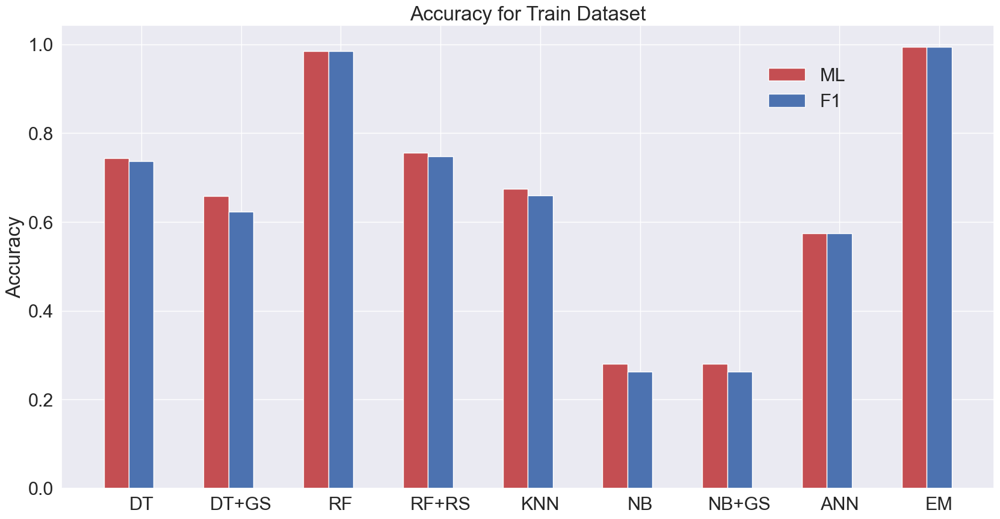

Train Dataset
ML Score = [0.7428455700520167, 0.6577044427389784, 0.9852306642790143, 0.7555214462351838, 0.6747420482646883, 0.2805747420482647, 0.2805747420482647, 0.5740001797676086, 0.9934979108041272]

F1 Score = [0.7361448992944285, 0.6223142270209604, 0.9852253327286582, 0.7474636236933772, 0.6598055468583165, 0.26241717640974377, 0.26241717640974377, 0.5740001797676086, 0.993492250756332]


In [64]:
# For Train Dataset

# X axis
x_values = ['DT', 'DT+GS', 'RF', 'RF+RS', 'KNN', 'NB', 'NB+GS', 'ANN', 'EM']

# set the width of the bars
bar_width = 0.25

# set the x locations of the bars
x_pos = np.arange(len(x_values))

# create the figure and axis objects
f, ax = plt.subplots(1,1,figsize = (20,10))

# create the bar plots
ax.bar(x_pos - bar_width, ml_train_acc, width=bar_width, color='r', label='ML')
ax.bar(x_pos, f1_train_acc, width=bar_width, color='b', label='F1')

# set the x-axis labels and tick marks
ax.set_xticks(x_pos)
ax.set_xticklabels(x_values)

# set the y-axis label
ax.set_ylabel('Accuracy')
plt.title("Accuracy for Train Dataset")

# Add Legend
plt.legend(loc=(0.75, 0.8), frameon=False)

# show the plot
plt.show()

print("Train Dataset")
print(f"ML Score = {ml_train_acc}")
print()
print(f"F1 Score = {f1_train_acc}")

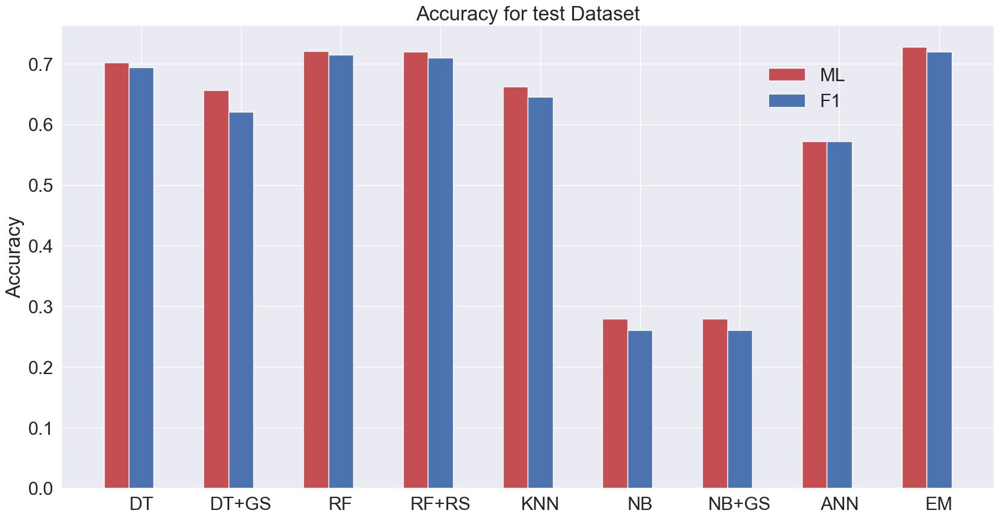

Test Dataset
ML Score = [0.7020452016423008, 0.6565749587506235, 0.720501899389893, 0.719696097617129, 0.6620237135950271, 0.27988181573999465, 0.27988181573999465, 0.5724262595176697, 0.7272552856759142]

F1 Score = [0.6935518569030472, 0.6206090543253069, 0.7149974767253996, 0.7096582112407331, 0.6458327655178924, 0.26108096608312165, 0.26108096608312165, 0.5724262595176697, 0.7202070780066933]


In [65]:
# For Test Dataset

# X axis
x_values = ['DT', 'DT+GS', 'RF', 'RF+RS', 'KNN', 'NB', 'NB+GS', 'ANN', 'EM']

# set the width of the bars
bar_width = 0.25

# set the x locations of the bars
x_pos = np.arange(len(x_values))

# create the figure and axis objects
f, ax = plt.subplots(1,1,figsize = (20,10))

# create the bar plots
ax.bar(x_pos - bar_width, ml_test_acc, width=bar_width, color='r', label='ML')
ax.bar(x_pos, f1_test_acc, width=bar_width, color='b', label='F1')

# set the x-axis labels and tick marks
ax.set_xticks(x_pos)
ax.set_xticklabels(x_values)

# set the y-axis label
ax.set_ylabel('Accuracy')
plt.title("Accuracy for test Dataset")

# Add Legend
plt.legend(loc=(0.75, 0.8), frameon=False)

# show the plot
plt.show()

print("Test Dataset")
print(f"ML Score = {ml_test_acc}")
print()
print(f"F1 Score = {f1_test_acc}")

# Conclusion
In Conclusion, the best algorithm for predicting damage grade is from Ensemble Method with accuracy around 72.72% with ML score and around 72% with F1 score<br>
Now, we can do the same thing but using feature selection variables to see if it can get higher accuracy

In [66]:
# Change string characters into integer
for i in df_mutual:
    if i in features_mutual:
        ordinal_label = {k: i for i, k in enumerate(df_mutual[i].unique(),0)}
        df_mutual[i] = df_mutual[i].map(ordinal_label)
    else:
        continue
        
X_mutual = df_mutual.copy().drop(["damage_grade",'building_id'], axis = 1)
Y_mutual = df_mutual[['damage_grade']]

In [67]:
# Do a train test split
X_mutual_train, X_mutual_test, Y_mutual_train, Y_mutual_test = train_test_split(X_mutual,Y_mutual,test_size = 0.1, random_state = 42)

ML Score:
Train accuracy = 0.9611366931013899
Test accuracy = 0.7178926365066575

F1 Score:
Train accuracy = 0.961059224260849
Test accuracy = 0.7125414509812412

Accuracy Score:
Train accuracy = 0.9611366931013899
Test accuracy = 0.7178926365066575


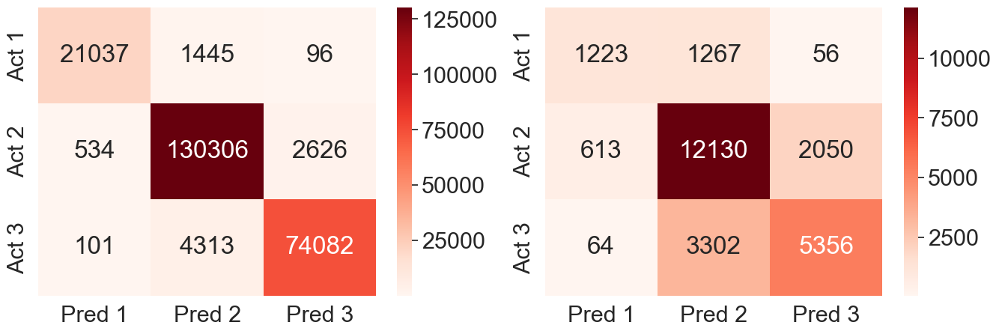

In [68]:
# Ensemble Method (Use the same parameter)
ensemble2 = VotingClassifier(estimators=[('rf', rf_en), ('dt', dt_en)],
                           **grid.best_params_)
ensemble2.fit(X_mutual_train, Y_mutual_train.values.ravel())
ensemble2_train_pred = ensemble2.predict(X_mutual_train)
ensemble2_test_pred = ensemble2.predict(X_mutual_test)

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_mutual_train, ensemble2_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_mutual_test, ensemble2_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Reds",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {ensemble2.score(X_mutual_train, Y_mutual_train)}')
print(f'Test accuracy = {ensemble2.score(X_mutual_test, Y_mutual_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_mutual_train, ensemble2_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_mutual_test, ensemble2_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_mutual_train, ensemble2_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_mutual_test, ensemble2_test_pred)}')

From this, we can see that the accuracy is higher when not using feature selection <br>
All Variable = 72.72% <br>
Feature Selection = 71.78%

However, if we are going to work on dataset that has over a million rows, it's better to use feature selection since it reduce running time signifficantly and the accuracy different is not too far

# Prediction on Test_Values
We run 1 more time for the whole dataset to get a new model and use the model to predict test_values

ML Score:
Train accuracy = 0.9789545493306046
Test accuracy = 0.7260657687732627

F1 Score:
Train accuracy = 0.9789265878684015
Test accuracy = 0.7200955688098547

Accuracy Score:
Train accuracy = 0.9789545493306046
Test accuracy = 0.7260657687732627


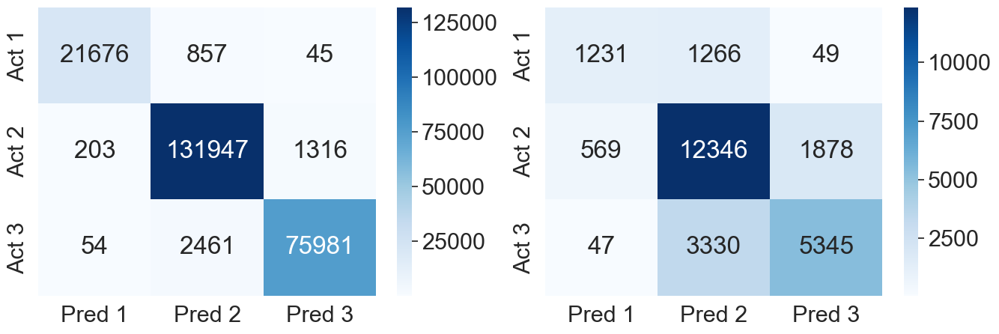

In [84]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size = 0.1, random_state = 42)

# Ensemble Method (Use the same parameter)
ensemble_final = VotingClassifier(estimators=[('rf', rf_en), ('dt', dt_en)],
                           **grid.best_params_)
ensemble_final.fit(X_train, Y_train.values.ravel())
ensemble_final_train_pred = ensemble_final.predict(X_train)
ensemble_final_test_pred = ensemble_final.predict(X_test)

# Visualize and heatmap
f, axes = plt.subplots(1,2,figsize = (16,5))
train_map = sns.heatmap(confusion_matrix(Y_train, ensemble_final_train_pred), annot = True, fmt = '.0f',
            ax = axes[0], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])
test_map = sns.heatmap(confusion_matrix(Y_test, ensemble_final_test_pred), annot = True, fmt = '.0f', 
            ax = axes[1], cmap = "Blues",
           xticklabels=["Pred 1", "Pred 2","Pred 3"], 
           yticklabels=["Act 1", "Act 2","Act 3"])

print('ML Score:')
print(f'Train accuracy = {ensemble_final.score(X_train, Y_train)}')
print(f'Test accuracy = {ensemble_final.score(X_test, Y_test)}')
print()
print('F1 Score:')
print(f'Train accuracy = {f1_score(Y_train, ensemble_final_train_pred, average="weighted")}')
print(f'Test accuracy = {f1_score(Y_test, ensemble_final_test_pred, average="weighted")}')
print()
print('Accuracy Score:')
print(f'Train accuracy = {accuracy_score(Y_train, ensemble_final_train_pred)}')
print(f'Test accuracy = {accuracy_score(Y_test, ensemble_final_test_pred)}')

We get accuracy around 72.6% with ML score and around 72% with F1 score

## Feature Importance

In [97]:
# Get feature importances from the RF and DT classifiers
rf_feature_importances = rf_en.feature_importances_
dt_feature_importances = dt_en.feature_importances_

# Combine the feature importances from the RF and DT classifiers
ensemble_feature_importances = (rf_feature_importances*3 + dt_feature_importances) / 4

importance = pd.Series(ensemble_feature_importances,index=X.columns).sort_values(ascending=False)
importance

geo_level_1_id                            0.198826
geo_level_2_id                            0.144284
geo_level_3_id                            0.132321
age                                       0.103342
area_percentage                           0.094769
foundation_type                           0.046552
height_percentage                         0.046443
other_floor_type                          0.023391
count_families                            0.019952
ground_floor_type                         0.019101
roof_type                                 0.018665
position                                  0.018194
has_superstructure_mud_mortar_stone       0.016220
land_surface_condition                    0.015870
count_floors_pre_eq                       0.013221
has_superstructure_timber                 0.010684
has_superstructure_cement_mortar_brick    0.009484
plan_configuration                        0.008156
legal_ownership_status                    0.007024
has_secondary_use              

<AxesSubplot:title={'center':'FEATURE IMPORTANCE'}>

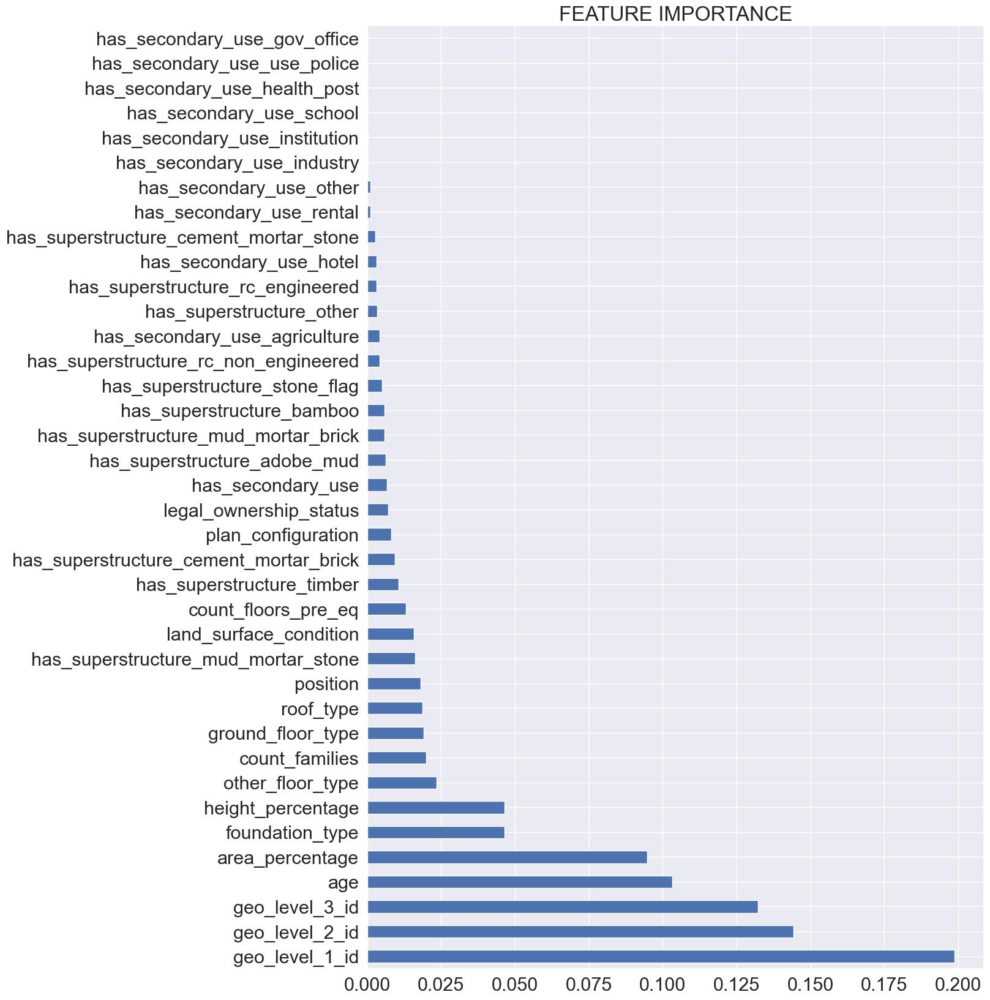

In [105]:
# Bar Plot
importance.plot.barh(figsize=(13,20), title="Feature Importance")

#### From Observation:
1. Geo Level are the most importance variable, which make sence, since they represents location of the building
2. Age is also importance 
3. Most of secondary use variables is not that important

## Prediciton

In [85]:
# Import the dataset
test_values = pd.read_csv('test_values.csv').drop("building_id", axis = 1)
test_values

# Change into categorical

# If the data type is "object" or it's a binary, it's a categorical value

for i in test_values:
    if test_values[i].dtype == "object":
        test_values[i] = test_values[i].astype("category")
    if test_values[i].dtype == "int64":
        if test_values[i].nunique() == 2:
            test_values[i] = test_values[i].astype("category")
            
# number of families, count floor, and damage grade are also a categorical data
test_values['count_families'] = test_values['count_families'].astype('category')
test_values['count_floors_pre_eq'] = test_values['count_floors_pre_eq'].astype('category')

# Change string into integer
for i in df_cat:
    if i == "damage_grade":
        continue
    ordinal_label = {k: i for i, k in enumerate(test_values[i].unique(),0)}
    test_values[i] = test_values[i].map(ordinal_label)

# Change column position to match with the model
test_values_num = test_values.select_dtypes("int64")
test_values_cat = test_values.select_dtypes("category")
predictors = pd.concat([test_values_num,test_values_cat], axis = 1)
predictors.head()

,geo_level_1_id,geo_level_2_id,geo_level_3_id,age,area_percentage,height_percentage,count_floors_pre_eq,land_surface_condition,foundation_type,roof_type,...,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,17,596,11307,20,7,6,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,6,141,11987,25,13,5,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,22,19,10044,5,4,5,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,26,39,633,0,19,3,2,0,0,1,...,0,0,1,0,0,0,0,0,0,0
4,17,289,7970,15,8,7,0,0,0,2,...,0,0,0,0,0,0,0,0,0,0


In [86]:
# Use the model to predict
results = ensemble_final.predict(predictors)

In [87]:
# Import the submission format
submission = pd.read_csv('submission_format.csv')

# Change the damage_grade value based on our prediction results
submission['damage_grade'] = pd.DataFrame(results)
submission

,building_id,damage_grade
0,300051,3
1,99355,2
2,890251,3
3,745817,2
4,421793,3
...,...,...
86863,310028,2
86864,663567,2
86865,1049160,2
86866,442785,2


Number of unique value: 3
2    67155
3    17594
1     2119
Name: damage_grade, dtype: int64


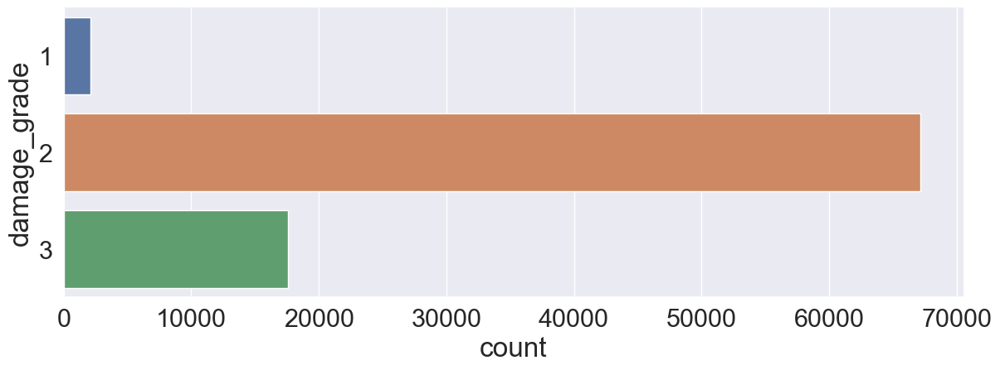

In [88]:
# Count plot to see the damage_grade distribution
g = sns.catplot(y = "damage_grade", data = submission, kind = "count")
g.fig.set_size_inches(15, 5)

print(f"Number of unique value: {submission['damage_grade'].nunique()}")
print(submission['damage_grade'].value_counts())

In [90]:
# Import back to excel and submit
submission.to_csv('submission.csv', index=False) # We don't need the index

# Score

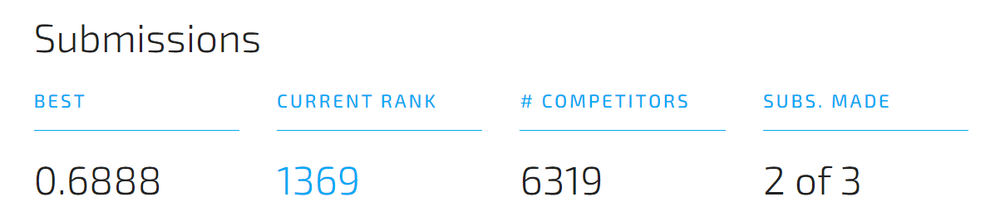

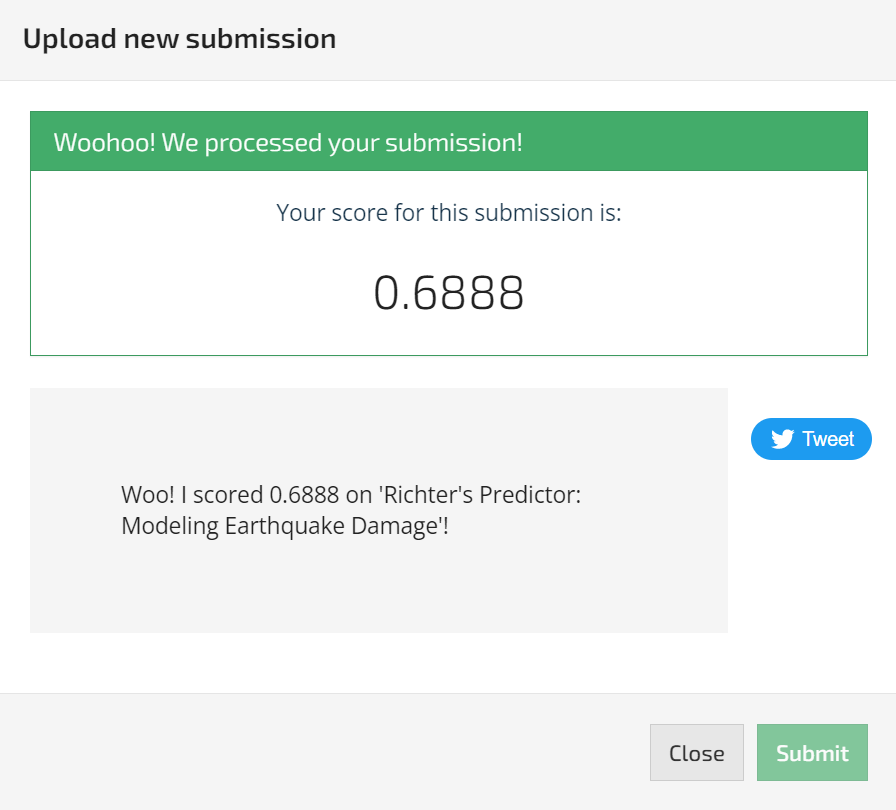